### 1. Preparation (mandatory everytime)

In [1]:
import warnings
warnings.filterwarnings('ignore')

!pip install geopandas
!pip install momepy
!pip3 install contextily

import os
import gc
import re

from logging import raiseExceptions

import numpy as np
import pandas as pd
from google.colab import drive, files
import matplotlib.pyplot as plt
import requests
import pickle
#from tqdm import tqdm
from tqdm.notebook import tqdm
from datetime import datetime
from sklearn import preprocessing
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import OneHotEncoder

import networkx as nx

# for the processing of locational data
import geopandas as gpd
from shapely.geometry import Point, LineString
import folium
import momepy
import contextily as cx

# for GNN
!pip3 install torch-geometric
!pip install torchmetrics

import torch
from torch import nn, optim, utils
from torch.nn import Linear, BatchNorm1d
from torch.nn import functional as F
from torch.utils.data import random_split, WeightedRandomSampler

from torch_geometric.data import Data, Dataset, DataLoader
from torch_geometric.utils import convert
from torch_geometric.utils import to_networkx
from torch_geometric.utils import to_dense_adj, to_dense_batch

from torch_geometric.nn import GCNConv
from torch_geometric.nn import global_mean_pool
from torch_geometric.nn import dense_mincut_pool
from torch_geometric.nn.dense import DenseGraphConv
#from torch_geometric.nn import knn

from torchmetrics import F1Score, Accuracy

# for knn graph
!pip install torch-cluster -f https://data.pyg.org/whl/torch-2.0.0+cu118.html
import torch_cluster
from torch_cluster import knn

#if torch.cuda.is_available():
#    import torch_cluster.knn_cuda

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 56.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.7/243.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 29.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 34.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 6.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.p

### 2. Bike Stations (nodes) - you can skip

In [ ]:
# get from the API
response = requests.get("https://api.tfl.gov.uk/BikePoint/")

# convert the JSON into GeoDataDrame
bike_points = gpd.GeoDataFrame(response.json())

# set geometry
bike_points = bike_points.set_geometry(gpd.points_from_xy(bike_points['lon'], bike_points['lat']), crs="EPSG:4326")

In [ ]:
# delete unnecessary columns
bike_points.drop(['$type','url','placeType','children','childrenUrls','additionalProperties'], axis=1, inplace=True)

# clean up the name of ID
bike_points['id'] = bike_points['id'].apply(lambda x: int(x[11:]))

In [ ]:
bike_points.head()

,id,commonName,lat,lon,geometry
0,1,"River Street , Clerkenwell",51.529163,-0.109970,POINT (-0.10997 51.52916)
1,2,"Phillimore Gardens, Kensington",51.499606,-0.197574,POINT (-0.19757 51.49961)
2,3,"Christopher Street, Liverpool Street",51.521283,-0.084605,POINT (-0.08460 51.52128)
3,4,"St. Chad's Street, King's Cross",51.530059,-0.120973,POINT (-0.12097 51.53006)
4,5,"Sedding Street, Sloane Square",51.493130,-0.156876,POINT (-0.15688 51.49313)


In [ ]:
# interactive map visualization
map = folium.Map(location=[51.507222,-0.1275], zoom_start=12)

def plot_bike_point(point):
    folium.CircleMarker(location=[point['lat'], point['lon']],
                        radius=2,
                        weight=5,
                        popup=point['commonName']).add_to(map)

# plot the bike points
bike_points.apply(plot_bike_point, axis = 1)

map

### 3. Land-use (node features) - you can skip

In [ ]:
# import land-use category

spatial_signature_london = gpd.read_file("/content/spatial_signature_london.gpkg")

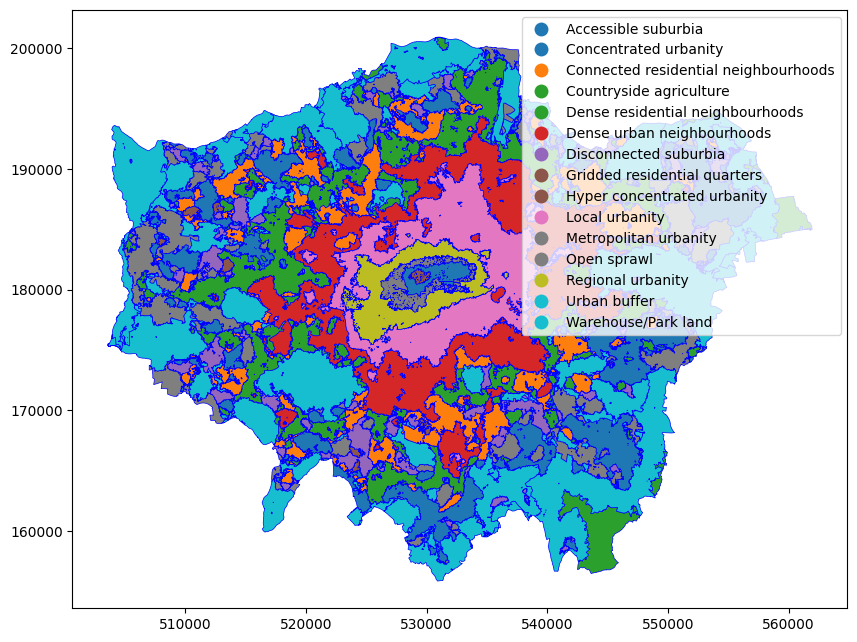

In [ ]:
# static map vizualisation
ax = spatial_signature_london.plot(figsize=(10,10), edgecolor='b', linewidth=.5, column="type", legend=True)
#cx.add_basemap(ax, zoom=14, crs=spatial_signature_london.crs)

In [ ]:
# transform the coordinate reference system
spatial_signature_london = spatial_signature_london.to_crs(4326)

In [ ]:
spatial_signature_london

,id,code,type,geometry
0,459_COA,COA,Countryside agriculture,"MULTIPOLYGON (((0.18264 51.62573, 0.18284 51.6..."
1,8479_COA,COA,Countryside agriculture,"MULTIPOLYGON (((-0.49717 51.61374, -0.49714 51..."
2,8495_COA,COA,Countryside agriculture,"MULTIPOLYGON (((-0.48717 51.61799, -0.48718 51..."
3,8500_COA,COA,Countryside agriculture,"MULTIPOLYGON (((-0.48544 51.61414, -0.48550 51..."
4,8501_COA,COA,Countryside agriculture,"MULTIPOLYGON (((-0.48510 51.61534, -0.48510 51..."
...,...,...,...,...
6128,96686_HDU,HDU,Hyper concentrated urbanity,"MULTIPOLYGON (((-0.14912 51.51417, -0.14891 51..."
6129,96687_HDU,HDU,Hyper concentrated urbanity,"MULTIPOLYGON (((-0.14806 51.51451, -0.14850 51..."
6130,96688_HDU,HDU,Hyper concentrated urbanity,"MULTIPOLYGON (((-0.14744 51.51524, -0.14751 51..."
6131,96689_HDU,HDU,Hyper concentrated urbanity,"MULTIPOLYGON (((-0.14610 51.51611, -0.14612 51..."


In [ ]:
# merge the bike points with land-use 
bike_points = bike_points.sjoin(spatial_signature_london, how="left")

In [ ]:
# merged result
bike_points.drop(["index_right", "id_right", "code"], axis=1, inplace=True)

# modify the column names
bike_points.columns = ['id', 'commonName', 'lat', 'lon', 'geometry', 'land_use']

In [ ]:
bike_points

,id,commonName,lat,lon,geometry,land_use
0,1,"River Street , Clerkenwell",51.529163,-0.109970,POINT (-0.10997 51.52916),Regional urbanity
1,2,"Phillimore Gardens, Kensington",51.499606,-0.197574,POINT (-0.19757 51.49961),Regional urbanity
2,3,"Christopher Street, Liverpool Street",51.521283,-0.084605,POINT (-0.08460 51.52128),Concentrated urbanity
3,4,"St. Chad's Street, King's Cross",51.530059,-0.120973,POINT (-0.12097 51.53006),Regional urbanity
4,5,"Sedding Street, Sloane Square",51.493130,-0.156876,POINT (-0.15688 51.49313),Metropolitan urbanity
...,...,...,...,...,...,...
794,850,"Brandon Street, Walworth",51.489102,-0.091548,POINT (-0.09155 51.48910),Local urbanity
795,851,"The Blue, Bermondsey",51.492221,-0.062513,POINT (-0.06251 51.49222),Local urbanity
796,852,"Coomer Place, West Kensington",51.483570,-0.202038,POINT (-0.20204 51.48357),Regional urbanity
797,482,"Exhibition Road Museums 2, South Kensington",51.495947,-0.173689,POINT (-0.17369 51.49595),Regional urbanity


### 4. Census (node features) - you can skip

In [ ]:
lsoa_london = gpd.read_file("/content/LSOA_London.gpkg")

In [ ]:
pop_london = pd.read_csv("/content/population_london.csv")

In [ ]:
# drop unnecessary columns
pop_london.drop(["Adults and children in household (11 categories) Code", 'Lower layer Super Output Areas'], axis=1, inplace=True)

In [ ]:
# pivot wider
pop_london = pd.pivot_table(pop_london, values='Observation', 
                            index=['Lower layer Super Output Areas Code'], 
                            columns=['Adults and children in household (11 categories)'])

In [ ]:
# merge with the geomertry dataset
lsoa_london = lsoa_london.merge(pop_london, left_on="LSOA21CD", right_on="Lower layer Super Output Areas Code")

In [ ]:
# drop unnecessary column
lsoa_london.drop(["Does not apply"], axis=1, inplace=True)

# calculate the sum
lsoa_london["total_household"] = lsoa_london.iloc[:,5:].apply(sum,axis=1)

In [ ]:
# interactive map
map = folium.Map(location=[51.507222,-0.1275], zoom_start=12)

folium.Choropleth(
    geo_data=lsoa_london["geometry"],
    name='Population Density',
    data=lsoa_london,
    columns=['LSOA21NM','total_household'],
    fill_color='OrRd',
    legend_name='Total household'
).add_to(map)

map

In [ ]:
# transform the coordinate reference system
lsoa_london = lsoa_london.to_crs(4326)

# merge the bike points with land-use
bike_points = bike_points.sjoin(lsoa_london, how="left")

# merged result
bike_points.drop(["index_right", "OBJECTID", "LSOA21NM", "GlobalID", "LSOA21CD"], axis=1, inplace=True)

In [ ]:
bike_points.columns = ['id',
                       'commonName',
                       'lat',
                       'lon',
                       'geometry',
                       'land_use',
                       'household_type_1',
                       'household_type_2',
                       'household_type_3',
                       'household_type_4',
                       'household_type_5',
                       'household_type_6',
                       'household_type_7',
                       'household_type_8',
                       'household_type_9',
                       'household_type_10',
                       'household_total']

In [ ]:
bike_points

,id,commonName,lat,lon,geometry,land_use,"No adults, or one adult and one or more children",One-person household: One adult aged 66 years or over,One-person household: One person aged 65 years or under,Three or more adults: No children,Three or more adults: One or more children,Two adults: Both adults aged 65 years or under: No children,Two adults: Both adults aged 66 years or over: No children,Two adults: One adult aged 65 years or under and one adult aged 66 years or over: No children,Two adults: One or two children,Two adults: Three or more children,total_household
0,1,"River Street , Clerkenwell",51.529163,-0.109970,POINT (-0.10997 51.52916),Regional urbanity,27,65,177,99,17,146,38,23,60,5,657
1,2,"Phillimore Gardens, Kensington",51.499606,-0.197574,POINT (-0.19757 51.49961),Regional urbanity,19,34,107,111,51,120,31,21,55,14,563
2,3,"Christopher Street, Liverpool Street",51.521283,-0.084605,POINT (-0.08460 51.52128),Concentrated urbanity,21,10,402,89,11,366,4,6,24,2,935
3,4,"St. Chad's Street, King's Cross",51.530059,-0.120973,POINT (-0.12097 51.53006),Regional urbanity,31,23,221,82,25,164,7,22,44,5,624
4,5,"Sedding Street, Sloane Square",51.493130,-0.156876,POINT (-0.15688 51.49313),Metropolitan urbanity,16,60,236,64,16,152,26,32,56,5,663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794,850,"Brandon Street, Walworth",51.489102,-0.091548,POINT (-0.09155 51.48910),Local urbanity,63,43,170,136,48,129,4,15,61,19,688
795,851,"The Blue, Bermondsey",51.492221,-0.062513,POINT (-0.06251 51.49222),Local urbanity,57,86,168,162,33,182,25,30,53,28,824
796,852,"Coomer Place, West Kensington",51.483570,-0.202038,POINT (-0.20204 51.48357),Regional urbanity,20,47,212,127,35,249,24,22,70,14,820
797,482,"Exhibition Road Museums 2, South Kensington",51.495947,-0.173689,POINT (-0.17369 51.49595),Regional urbanity,8,47,198,69,9,106,27,21,48,4,537


In [ ]:
# save the output
bike_points.to_file("/content/bike_points_preprocessed.geojson", driver='GeoJSON')

### 5. Skip preprocessing for nodes - you can skip

In [ ]:
drive.mount("/content/drive", force_remount=True)
with open("/content/drive/MyDrive/01 data/bike_points_preprocessed.geojson", "rb") as bike_points_file:
  bike_points = gpd.read_file(bike_points_file)

Mounted at /content/drive


In [ ]:
# upload "bike_points_preprocessed.geojson"
#uploaded = files.upload()

# import the geojson
#bike_points = gpd.read_file("/content/bike_points_preprocessed.geojson")
#bike_points = gpd.read_file("/content/drive/MyDrive/01 data/bike_points_preprocessed.geojson")

In [ ]:
bike_points

,id,commonName,lat,lon,land_use,household_type_1,household_type_2,household_type_3,household_type_4,household_type_5,household_type_6,household_type_7,household_type_8,household_type_9,household_type_10,household_total,geometry
0,1,"River Street , Clerkenwell",51.529163,-0.109970,Regional urbanity,27,65,177,99,17,146,38,23,60,5,657,POINT (-0.10997 51.52916)
1,2,"Phillimore Gardens, Kensington",51.499606,-0.197574,Regional urbanity,19,34,107,111,51,120,31,21,55,14,563,POINT (-0.19757 51.49961)
2,3,"Christopher Street, Liverpool Street",51.521283,-0.084605,Concentrated urbanity,21,10,402,89,11,366,4,6,24,2,935,POINT (-0.08460 51.52128)
3,4,"St. Chad's Street, King's Cross",51.530059,-0.120973,Regional urbanity,31,23,221,82,25,164,7,22,44,5,624,POINT (-0.12097 51.53006)
4,5,"Sedding Street, Sloane Square",51.493130,-0.156876,Metropolitan urbanity,16,60,236,64,16,152,26,32,56,5,663,POINT (-0.15688 51.49313)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794,850,"Brandon Street, Walworth",51.489102,-0.091548,Local urbanity,63,43,170,136,48,129,4,15,61,19,688,POINT (-0.09155 51.48910)
795,851,"The Blue, Bermondsey",51.492221,-0.062513,Local urbanity,57,86,168,162,33,182,25,30,53,28,824,POINT (-0.06251 51.49222)
796,852,"Coomer Place, West Kensington",51.483570,-0.202038,Regional urbanity,20,47,212,127,35,249,24,22,70,14,820,POINT (-0.20204 51.48357)
797,482,"Exhibition Road Museums 2, South Kensington",51.495947,-0.173689,Regional urbanity,8,47,198,69,9,106,27,21,48,4,537,POINT (-0.17369 51.49595)


In [ ]:
# one-hot encoding for land_use
land_use = pd.get_dummies(bike_points["land_use"])
land_use.columns = ["land_use_type_{}".format(i+1) for i in range(len(land_use.columns))]

# concatinate the one-hot encoded columns
bike_points[["land_use_type_{}".format(i+1) for i in range(len(land_use.columns))]] = land_use

In [ ]:
# show the dataset
bike_points.head(5)

,id,commonName,lat,lon,land_use,household_type_1,household_type_2,household_type_3,household_type_4,household_type_5,...,household_type_9,household_type_10,household_total,geometry,land_use_type_1,land_use_type_2,land_use_type_3,land_use_type_4,land_use_type_5,land_use_type_6
0,1,"River Street , Clerkenwell",51.529163,-0.109970,Regional urbanity,27,65,177,99,17,...,60,5,657,POINT (-0.10997 51.52916),0,0,0,0,0,1
1,2,"Phillimore Gardens, Kensington",51.499606,-0.197574,Regional urbanity,19,34,107,111,51,...,55,14,563,POINT (-0.19757 51.49961),0,0,0,0,0,1
2,3,"Christopher Street, Liverpool Street",51.521283,-0.084605,Concentrated urbanity,21,10,402,89,11,...,24,2,935,POINT (-0.08460 51.52128),1,0,0,0,0,0
3,4,"St. Chad's Street, King's Cross",51.530059,-0.120973,Regional urbanity,31,23,221,82,25,...,44,5,624,POINT (-0.12097 51.53006),0,0,0,0,0,1
4,5,"Sedding Street, Sloane Square",51.493130,-0.156876,Metropolitan urbanity,16,60,236,64,16,...,56,5,663,POINT (-0.15688 51.49313),0,0,0,0,1,0


### 6. Travel Records (edges) - you can skip

In [ ]:
def fetch_dataset(file_name, bike_points):
  """
  This function fetches the original dataset of travel records in pd.DataFrame format

  Args:
      file_name: name of the csv file

  Returns:
      travel_df: original table in pd.DataFrame
  """

  # set the file path
  file_path = "https://cycling.data.tfl.gov.uk/usage-stats/" + file_name

  # download the travel records
  !wget -O {file_name} {file_path}

  # import the csv as a dataframe
  travel_df = pd.read_csv(file_name)

  # filter edges where nodes are in the bike_points
  travel_df = travel_df[travel_df["StartStation Id"].isin(bike_points["id"]) & travel_df["EndStation Id"].isin(bike_points["id"])]

  return travel_df

Firstly, travel records are aggregated into directed arrows.

In [ ]:
def aggregate_directed_edges(travel_df):
  """
  This function aggregates the directed edges from the dataframe of travel records in the original format.

  Args:
      travel_df: original dataframe of travel records in pd.DataFrame format.

  Returns:
      travel_df: aggregated dataframe by directed edges
  """

  # select only the start date, start station id, and end station id
  try:
    travel_df = travel_df[["Start Date", "StartStation Name", "EndStation Name"]]
    time_format = "%d/%m/%Y %H:%M"

  except:
    travel_df.rename(columns={"Start date":"Start Date", 'Start station': 'StartStation Name', 'End station': 'EndStation Name'}, inplace=True)
    travel_df = travel_df[["Start Date", "StartStation Name", "EndStation Name"]]

    time_format = "%Y-%m-%d %H:%M"

  # convert the start date into datetime
  travel_df["Start Date"] = pd.to_datetime(travel_df["Start Date"], format=time_format)

  # group by date and edge and count the number of travels
  travel_df = travel_df.groupby([travel_df["Start Date"].dt.date,
                                travel_df["StartStation Id"],
                                travel_df["EndStation Id"]]).agg(['count']).reset_index()

  # flatten multi-indices
  travel_df.columns = pd.Index(["Start Date", "StartStation Id", "EndStation Id", "count"])

  return travel_df

In [ ]:
def aggregate_directed_edges_for_newer_api(travel_df):
  """
  This function aggregates the directed edges from the dataframe of travel records in the original format.

  Args:
      travel_df: original dataframe of travel records in pd.DataFrame format.

  Returns:
      travel_df: aggregated dataframe by directed edges
  """

  # select only the start date, start station id, and end station id
  try:
    travel_df = travel_df[["Start Date", "StartStation Name", "EndStation Name"]]
    time_format = "%d/%m/%Y %H:%M"

  except:
    travel_df.rename(columns={"Start date":"Start Date", 'Start station': 'StartStation Name', 'End station': 'EndStation Name'}, inplace=True)
    travel_df = travel_df[["Start Date", "StartStation Name", "EndStation Name"]]

    time_format = "%Y-%m-%d %H:%M"

  # convert the start date into datetime
  travel_df["Start Date"] = pd.to_datetime(travel_df["Start Date"], format=time_format)

  # group by date and edge and count the number of travels
  travel_df = travel_df.groupby([travel_df["Start Date"].dt.date,
                                travel_df["StartStation Name"],
                                travel_df["EndStation Name"]]).agg(['count']).reset_index()

  # flatten multi-indices
  travel_df.columns = pd.Index(["Start Date", "StartStation Name", "EndStation Name", "count"])

  return travel_df

Based on this function, rows are aggregated by undirected edges.

In [ ]:
def aggregate_undirected_edges(travel_df):
  """
  This function aggregates the undirected edges from the dataframe of travel records in the original format.

  Args:
      travel_df: original dataframe of travel records in pd.DataFrame format.

  Returns:
      travel_df: aggregated dataframe by undirected edges
  """

  # aggregate edges by directed edges
  travel_df = aggregate_directed_edges(travel_df)

  # create a column of frozenset of edges (permutation-invariant)
  travel_df['edge'] = travel_df.apply(lambda row: frozenset({row['StartStation Id'], row['EndStation Id']}), axis=1)

  # aggregate the both direction of the same connections
  travel_df = travel_df.groupby([travel_df["Start Date"],
                                 travel_df["edge"]]).agg({'count':['sum']}).reset_index()

  # flatten multi-indices
  travel_df.columns = pd.Index(["Start Date", "edge", "count"])

  # create a function to extract node (if self-loop return the first element)
  def extract_node(edge, idx):
    edge = list(edge)
    try:
      return edge[idx]
    except:
      return edge[0]

  # bring back the nodes
  travel_df["StartStation Id"] = travel_df["edge"].apply(extract_node, idx=0)
  travel_df["EndStation Id"]   = travel_df["edge"].apply(extract_node, idx=1)

  # delete edge column
  travel_df.drop(["edge"], axis=1, inplace=True)

  return travel_df

In [ ]:
def aggregate_undirected_edges_for_new_api(travel_df):
  """
  This function aggregates the undirected edges from the dataframe of travel records in the original format.

  Args:
      travel_df: original dataframe of travel records in pd.DataFrame format.

  Returns:
      travel_df: aggregated dataframe by undirected edges
  """

  # aggregate edges by directed edges
  travel_df = aggregate_directed_edges_for_newer_api(travel_df)

  # create a column of frozenset of edges (permutation-invariant)
  travel_df['edge'] = travel_df.apply(lambda row: frozenset({row['StartStation Name'], row['EndStation Name']}), axis=1)

  # aggregate the both direction of the same connections
  travel_df = travel_df.groupby([travel_df["Start Date"],
                                 travel_df["edge"]]).agg({'count':['sum']}).reset_index()

  # flatten multi-indices
  travel_df.columns = pd.Index(["Start Date", "edge", "count"])

  # create a function to extract node (if self-loop return the first element)
  def extract_node(edge, idx):
    edge = list(edge)
    try:
      return edge[idx]
    except:
      return edge[0]

  # bring back the nodes
  travel_df["StartStation Name"] = travel_df["edge"].apply(extract_node, idx=0)
  travel_df["EndStation Name"]   = travel_df["edge"].apply(extract_node, idx=1)

  # delete edge column
  travel_df.drop(["edge"], axis=1, inplace=True)

  return travel_df

In [ ]:
def fetch_dataset_for_newer_api(file_name, bike_points):
  """
  This function fetches the original dataset of travel records in pd.DataFrame format

  Args:
      file_name: name of the csv file

  Returns:
      travel_df: original table in pd.DataFrame
  """

  # set the file path
  file_path = "https://cycling.data.tfl.gov.uk/usage-stats/" + file_name

  # download the travel records
  !wget -O {file_name} {file_path}

  # import the csv as a dataframe
  travel_df = pd.read_csv(file_name)

  # filter edges where nodes are in the bike_points
  try:
    travel_df = travel_df[travel_df["Start station"].isin(bike_points["commonName"]) & travel_df["End station"].isin(bike_points["commonName"])]
  except:
    travel_df = travel_df[travel_df["StartStation Name"].isin(bike_points["commonName"]) & travel_df["EndStation Name"].isin(bike_points["commonName"])]

  return travel_df

In [ ]:
def create_travel_df(file_name, bike_points):
  """
  This function creates download the travel records and create aggregated pd.DataFrame by undirected rows. 

  Args:
      file_name: name of the file on the API of Transport for London (TfL).

  Returns:
      travel_df: aggregated pd.DataFrame of travel records
  """

  try:
    # fetch the dataset
    travel_df = fetch_dataset(file_name, bike_points)

    # aggregate rows by undirected edges
    travel_df = aggregate_undirected_edges(travel_df)
  
  except:
    travel_df = fetch_dataset_for_newer_api(file_name, bike_points)

    # aggregate rows by undirected edges
    travel_df = aggregate_undirected_edges_for_new_api(travel_df)

    # convert name into id
    travel_df = convert_name_to_id(travel_df, bike_points)

  return travel_df

In [ ]:
def convert_name_to_id(travel_df, bike_points):
  """
  This function convets the name of stations into IDs in the bike_points.

  Args:
      travel_df: a dataframe of undirected edges in pd.DataFrame format.
      bike_points: a dataframe of bike points

  Returns:
      travel_df: a dataframe with name conversion into IDs.
  """

  name_id_dict = {bike_points["commonName"][idx]:bike_points["id"][idx] for idx in bike_points.index}

  travel_df['StartStation Id'] = travel_df['StartStation Name'].apply(lambda x: name_id_dict[x])
  travel_df['EndStation Id'] = travel_df['EndStation Name'].apply(lambda x: name_id_dict[x])

  travel_df.drop(["StartStation Name", "EndStation Name"], axis=1, inplace=True)

  return travel_df

In [ ]:
def create_nx_graph(travel_df, bike_points=bike_points):
  """
  This function creates a nx.classes.graph.Graph object from travel_df and bike_points

  Args:
      travel_df: aggregated pd.DataFrame of travel records
      bike_points: nodes of bike stations

  Returns:
      G: a nx.classes.graph.Graph from the input nodes and edges
  """

  # filter edges where nodes are in the bike_points
  travel_df = travel_df[travel_df["StartStation Id"].isin(bike_points["id"]) & travel_df["EndStation Id"].isin(bike_points["id"])]

  # create a nx object
  G = nx.from_pandas_edgelist(df=travel_df, source='StartStation Id', target='EndStation Id', edge_attr='count')
  
  # set commonName as index
  bike_points.index = bike_points['id']

  # drop geometry
  b_p = bike_points.drop(["id", "land_use", "commonName", "geometry"], axis=1)
  
  # add node attributes into the graph
  nx.set_node_attributes(G, b_p.to_dict('index'))

  return G

In [ ]:
# create a list of csv files of travel records in 2021
travel_record_paths = ["246JourneyDataExtract30Dec2020-05Jan2021.csv",
                       "247JourneyDataExtract06Jan2021-12Jan2021.csv",
                       "248JourneyDataExtract13Jan2021-19Jan2021.csv",
                       "249JourneyDataExtract20Jan2021-26Jan2021.csv",
                       "250JourneyDataExtract27Jan2021-02Feb2021.csv",
                       "251JourneyDataExtract03Feb2021-09Feb2021.csv",
                       "252JourneyDataExtract10Feb2021-16Feb2021.csv",
                       "253JourneyDataExtract17Feb2021-23Feb2021.csv",
                       "254JourneyDataExtract24Feb2021-02Mar2021.csv",
                       "255JourneyDataExtract03Mar2021-09Mar2021.csv",
                       "256JourneyDataExtract10Mar2021-16Mar2021.csv",
                       "257JourneyDataExtract17Mar2021-23Mar2021.csv",
                       "258JourneyDataExtract24Mar2021-30Mar2021.csv",
                       "259JourneyDataExtract31Mar2021-06Apr2021.csv",
                       "260JourneyDataExtract07Apr2021-13Apr2021.csv",
                       "261JourneyDataExtract14Apr2021-20Apr2021.csv",
                       "262JourneyDataExtract21Apr2021-27Apr2021.csv",
                       "263JourneyDataExtract28Apr2021-04May2021.csv",
                       "264JourneyDataExtract05May2021-11May2021.csv",
                       "265JourneyDataExtract12May2021-18May2021.csv",
                       "266JourneyDataExtract19May2021-25May2021.csv",
                       "267JourneyDataExtract26May2021-01Jun2021.csv",
                       "268JourneyDataExtract02Jun2021-08Jun2021.csv",
                       "269JourneyDataExtract09Jun2021-15Jun2021.csv",
                       "270JourneyDataExtract16Jun2021-22Jun2021.csv",
                       "271JourneyDataExtract23Jun2021-29Jun2021.csv",
                       "272JourneyDataExtract30Jun2021-06Jul2021.csv",
                       "273JourneyDataExtract07Jul2021-13Jul2021.csv",
                       "274JourneyDataExtract14Jul2021-20Jul2021.csv",
                       "275JourneyDataExtract21Jul2021-27Jul2021.csv",
                       "276JourneyDataExtract28Jul2021-03Aug2021.csv",
                       "277JourneyDataExtract04Aug2021-10Aug2021.csv",
                       "278JourneyDataExtract11Aug2021-17Aug2021.csv",
                       "279JourneyDataExtract18Aug2021-24Aug2021.csv",
                       "280JourneyDataExtract25Aug2021-31Aug2021.csv",
                       "281JourneyDataExtract01Sep2021-07Sep2021.csv",
                       "282JourneyDataExtract08Sep2021-14Sep2021.csv",
                       "283JourneyDataExtract15Sep2021-21Sep2021.csv",
                       "284JourneyDataExtract22Sep2021-28Sep2021.csv",
                       "285JourneyDataExtract29Sep2021-05Oct2021.csv",
                       "286JourneyDataExtract06Oct2021-12Oct2021.csv",
                       "287JourneyDataExtract13Oct2021-19Oct2021.csv",
                       "288JourneyDataExtract20Oct2021-26Oct2021.csv",
                       "289JourneyDataExtract27Oct2021-02Nov2021.csv",
                       "290JourneyDataExtract03Nov2021-09Nov2021.csv",
                       "291JourneyDataExtract10Nov2021-16Nov2021.csv",
                       "292JourneyDataExtract17Nov2021-23Nov2021.csv",
                       "293JourneyDataExtract24Nov2021-30Nov2021.csv",
                       "294JourneyDataExtract01Dec2021-07Dec2021.csv",
                       "295JourneyDataExtract08Dec2021-14Dec2021.csv",
                       "296JourneyDataExtract15Dec2021-21Dec2021.csv",
                       "297JourneyDataExtract22Dec2021-28Dec2021.csv",
                       "298JourneyDataExtract29Dec2021-04Jan2022.csv"]

In [ ]:
# create a list of csv files of travel records in 2021 and 2022
travel_record_paths = ["246JourneyDataExtract30Dec2020-05Jan2021.csv",
                       "247JourneyDataExtract06Jan2021-12Jan2021.csv",
                       "248JourneyDataExtract13Jan2021-19Jan2021.csv",
                       "249JourneyDataExtract20Jan2021-26Jan2021.csv",
                       "250JourneyDataExtract27Jan2021-02Feb2021.csv",
                       "251JourneyDataExtract03Feb2021-09Feb2021.csv",
                       "252JourneyDataExtract10Feb2021-16Feb2021.csv",
                       "253JourneyDataExtract17Feb2021-23Feb2021.csv",
                       "254JourneyDataExtract24Feb2021-02Mar2021.csv",
                       "255JourneyDataExtract03Mar2021-09Mar2021.csv",
                       "256JourneyDataExtract10Mar2021-16Mar2021.csv",
                       "257JourneyDataExtract17Mar2021-23Mar2021.csv",
                       "258JourneyDataExtract24Mar2021-30Mar2021.csv",
                       "259JourneyDataExtract31Mar2021-06Apr2021.csv",
                       "260JourneyDataExtract07Apr2021-13Apr2021.csv",
                       "261JourneyDataExtract14Apr2021-20Apr2021.csv",
                       "262JourneyDataExtract21Apr2021-27Apr2021.csv",
                       "263JourneyDataExtract28Apr2021-04May2021.csv",
                       "264JourneyDataExtract05May2021-11May2021.csv",
                       "265JourneyDataExtract12May2021-18May2021.csv",
                       "266JourneyDataExtract19May2021-25May2021.csv",
                       "267JourneyDataExtract26May2021-01Jun2021.csv",
                       "268JourneyDataExtract02Jun2021-08Jun2021.csv",
                       "269JourneyDataExtract09Jun2021-15Jun2021.csv",
                       "270JourneyDataExtract16Jun2021-22Jun2021.csv",
                       "271JourneyDataExtract23Jun2021-29Jun2021.csv",
                       "272JourneyDataExtract30Jun2021-06Jul2021.csv",
                       "273JourneyDataExtract07Jul2021-13Jul2021.csv",
                       "274JourneyDataExtract14Jul2021-20Jul2021.csv",
                       "275JourneyDataExtract21Jul2021-27Jul2021.csv",
                       "276JourneyDataExtract28Jul2021-03Aug2021.csv",
                       "277JourneyDataExtract04Aug2021-10Aug2021.csv",
                       "278JourneyDataExtract11Aug2021-17Aug2021.csv",
                       "279JourneyDataExtract18Aug2021-24Aug2021.csv",
                       "280JourneyDataExtract25Aug2021-31Aug2021.csv",
                       "281JourneyDataExtract01Sep2021-07Sep2021.csv",
                       "282JourneyDataExtract08Sep2021-14Sep2021.csv",
                       "283JourneyDataExtract15Sep2021-21Sep2021.csv",
                       "284JourneyDataExtract22Sep2021-28Sep2021.csv",
                       "285JourneyDataExtract29Sep2021-05Oct2021.csv",
                       "286JourneyDataExtract06Oct2021-12Oct2021.csv",
                       "287JourneyDataExtract13Oct2021-19Oct2021.csv",
                       "288JourneyDataExtract20Oct2021-26Oct2021.csv",
                       "289JourneyDataExtract27Oct2021-02Nov2021.csv",
                       "290JourneyDataExtract03Nov2021-09Nov2021.csv",
                       "291JourneyDataExtract10Nov2021-16Nov2021.csv",
                       "292JourneyDataExtract17Nov2021-23Nov2021.csv",
                       "293JourneyDataExtract24Nov2021-30Nov2021.csv",
                       "294JourneyDataExtract01Dec2021-07Dec2021.csv",
                       "295JourneyDataExtract08Dec2021-14Dec2021.csv",
                       "296JourneyDataExtract15Dec2021-21Dec2021.csv",
                       "297JourneyDataExtract22Dec2021-28Dec2021.csv",
                       "298JourneyDataExtract29Dec2021-04Jan2022.csv",
                       "299JourneyDataExtract05Jan2022-11Jan2022.csv",
                       "300JourneyDataExtract12Jan2022-18Jan2022.csv",
                       "301JourneyDataExtract19Jan2022-25Jan2022.csv",
                       "302JourneyDataExtract26Jan2022-01Feb2022.csv",
                       "303JourneyDataExtract02Feb2022-08Feb2022.csv",
                       "304JourneyDataExtract09Feb2022-15Feb2022.csv",
                       "305JourneyDataExtract16Feb2022-22Feb2022.csv",
                       "306JourneyDataExtract23Feb2022-01Mar2022.csv",
                       "307JourneyDataExtract02Mar2022-08Mar2022.csv",
                       "308JourneyDataExtract09Mar2022-15Mar2022.csv",
                       "309JourneyDataExtract16Mar2022-22Mar2022.csv",
                       "310JourneyDataExtract23Mar2022-29Mar2022.csv",
                       "311JourneyDataExtract30Mar2022-05Apr2022.csv",
                       "312JourneyDataExtract06Apr2022-12Apr2022.csv",
                       "313JourneyDataExtract13Apr2022-19Apr2022.csv",
                       "314JourneyDataExtract20Apr2022-26Apr2022.csv",
                       "315JourneyDataExtract27Apr2022-03May2022.csv",
                       "316JourneyDataExtract04May2022-10May2022.csv",
                       "317JourneyDataExtract11May2022-17May2022.csv",
                       "318JourneyDataExtract18May2022-24May2022.csv",
                       "319JourneyDataExtract25May2022-31May2022.csv",
                       "320JourneyDataExtract01Jun2022-07Jun2022.csv",
                       "321JourneyDataExtract08Jun2022-14Jun2022.csv",
                       "322JourneyDataExtract15Jun2022-21Jun2022.csv",
                       "323JourneyDataExtract22Jun2022-28Jun2022.csv",
                       "324JourneyDataExtract29Jun2022-05Jul2022.csv",
                       "325JourneyDataExtract06Jul2022-12Jul2022.csv",
                       "326JourneyDataExtract13Jul2022-19Jul2022.csv",
                       "327JourneyDataExtract20Jul2022-26Jul2022.csv",
                       "328JourneyDataExtract27Jul2022-02Aug2022.csv",
                       "329JourneyDataExtract03Aug2022-09Aug2022.csv",
                       "330JourneyDataExtract10Aug2022-16Aug2022.csv",
                       "331JourneyDataExtract17Aug2022-23Aug2022.csv",
                       "332JourneyDataExtract24Aug2022-30Aug2022.csv",
                       "333JourneyDataExtract31Aug2022-06Sep2022.csv",
                       "334JourneyDataExtract07Sep2022-11Sep2022.csv",
                       "335JourneyDataExtract12Sep2022-18Sep2022.csv",
                       "336JourneyDataExtract19Sep2022-25Sep2022.csv",
                       "337JourneyDataExtract26Sep2022-02Oct2022.csv",
                       "338JourneyDataExtract03Oct2022-09Oct2022.csv",
                       "339JourneyDataExtract10Oct2022-16Oct2022.csv",
                       "340JourneyDataExtract17Oct2022-23Oct2022.csv",
                       "341JourneyDataExtract24Oct2022-30Oct2022.csv",
                       "342JourneyDataExtract31Oct2022-06Nov2022.csv",
                       "343JourneyDataExtract07Nov2022-13Nov2022.csv",
                       "344JourneyDataExtract14Nov2022-20Nov2022.csv",
                       "345JourneyDataExtract21Nov2022-27Nov2022.csv",
                       "346JourneyDataExtract28Nov2022-04Dec2022.csv",
                       "347JourneyDataExtract05Dec2022-11Dec2022.csv",
                       "348JourneyDataExtract12Dec2022-18Dec2022.csv",
                       "349JourneyDataExtract19Dec2022-25Dec2022.csv",
                       "350JourneyDataExtract26Dec2022-01Jan2023.csv"
                       ]

In [ ]:
# initialize a dictionary of graphs
G_dict = {}

# set the file name and path (ex. first ten)
file_names = travel_record_paths

# iterate over file_names
for fn in file_names:

  # create a travel_df all at once
  travel_df = create_travel_df(fn, bike_points)

  # create graphs by date
  dates = travel_df["Start Date"].unique()
  G_dict.update({date.strftime("%Y-%m-%d"): create_nx_graph(travel_df[travel_df["Start Date"] == date]) for date in dates})
  os.remove("/content/" + fn)

# release memory
gc.collect()

# save G_dict
with open("/content/G_dict.pickle", 'wb') as pickle_file:
    pickle.dump(G_dict, pickle_file)

--2023-04-25 17:09:32--  https://cycling.data.tfl.gov.uk/usage-stats/246JourneyDataExtract30Dec2020-05Jan2021.csv
Resolving cycling.data.tfl.gov.uk (cycling.data.tfl.gov.uk)... 104.16.100.13, 104.16.101.13
Connecting to cycling.data.tfl.gov.uk (cycling.data.tfl.gov.uk)|104.16.100.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11485934 (11M) [text/csv]
Saving to: ‘246JourneyDataExtract30Dec2020-05Jan2021.csv’

246JourneyDataExtra 100%[===================>]  10.95M  15.4MB/s    in 0.7s    

2023-04-25 17:09:34 (15.4 MB/s) - ‘246JourneyDataExtract30Dec2020-05Jan2021.csv’ saved [11485934/11485934]

--2023-04-25 17:09:35--  https://cycling.data.tfl.gov.uk/usage-stats/246JourneyDataExtract30Dec2020-05Jan2021.csv
Resolving cycling.data.tfl.gov.uk (cycling.data.tfl.gov.uk)... 104.16.100.13, 104.16.101.13
Connecting to cycling.data.tfl.gov.uk (cycling.data.tfl.gov.uk)|104.16.100.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11485934 (

In [ ]:
G_dict

{'2020-12-30': <networkx.classes.graph.Graph at 0x7eff9854ee50>,
 '2020-12-31': <networkx.classes.graph.Graph at 0x7efee362c9d0>,
 '2021-01-01': <networkx.classes.graph.Graph at 0x7efde8595100>,
 '2021-01-02': <networkx.classes.graph.Graph at 0x7efde8595bb0>,
 '2021-01-03': <networkx.classes.graph.Graph at 0x7efde85950a0>,
 '2021-01-04': <networkx.classes.graph.Graph at 0x7efde85954c0>,
 '2021-01-05': <networkx.classes.graph.Graph at 0x7efde8595610>,
 '2021-01-06': <networkx.classes.graph.Graph at 0x7effd03512b0>,
 '2021-01-07': <networkx.classes.graph.Graph at 0x7effd0351b20>,
 '2021-01-08': <networkx.classes.graph.Graph at 0x7effd0351190>,
 '2021-01-09': <networkx.classes.graph.Graph at 0x7effd0351b50>,
 '2021-01-10': <networkx.classes.graph.Graph at 0x7effd0351af0>,
 '2021-01-11': <networkx.classes.graph.Graph at 0x7effd0351d90>,
 '2021-01-12': <networkx.classes.graph.Graph at 0x7efdf2d89040>,
 '2021-01-13': <networkx.classes.graph.Graph at 0x7efdf2d896d0>,
 '2021-01-14': <networkx.

Non-spatial visualization of edges (if needed)

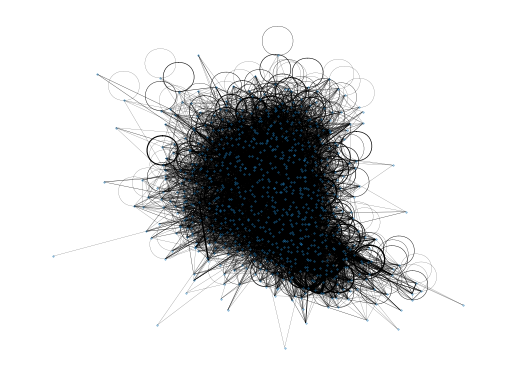

In [ ]:
edge_weights = nx.get_edge_attributes(G_dict["2021-02-06"], "count").values()
edge_weights = [w * 0.1 for w in edge_weights]

plt.plot(figsize=(15,15))
nx.draw(G_dict["2021-02-06"],
        node_size = 0.1,
        width = edge_weights)

Spatial visualization of edges (if needed)

In [ ]:
travel_df = create_travel_df("263JourneyDataExtract28Apr2021-04May2021.csv")

TypeError: ignored

In [ ]:
def vizualize_travels(travel_df, bike_points):
  # reset index for bike_points
  bike_points = bike_points.reset_index(drop=True)

  # merge with bike_points for the station ID and the coordinates
  viz = pd.merge(travel_df, bike_points, left_on='StartStation Id', right_on='id')
  viz = viz.merge(bike_points, left_on='EndStation Id', right_on='id', suffixes=['_start', '_end'])


  # replace the station ID with the one from bike_points
  viz['Start station number'] = viz['id_start']
  viz['End station number']   = viz['id_end']

  # delete unnecessary columns
  viz.drop(['id_start','id_end', 'commonName_start', 'commonName_end', 'lat_start', 'lon_start', 'lat_end', 'lon_end'], axis=1, inplace=True)

  # create edges from the nodes
  viz['route'] = viz.apply(lambda row: LineString([row['geometry_start'], row['geometry_end']]), axis=1)

  # set geometry
  viz = viz.set_geometry(viz['route'], crs='EPSG:4326')

  # change the coordinate reference system for London
  viz = viz.to_crs("EPSG:27700")
  bike_points = bike_points.to_crs("EPSG:27700")

  # static map vizualisation
  ax = viz.plot(figsize=(15,15), alpha=.15, edgecolor='b', linewidth=.5)
  bike_points.plot(ax=ax, marker='o', color='black', markersize=15)
  cx.add_basemap(ax, zoom=14, crs=viz.crs, source=cx.providers.Stamen.Toner)
  plt.axis('off')

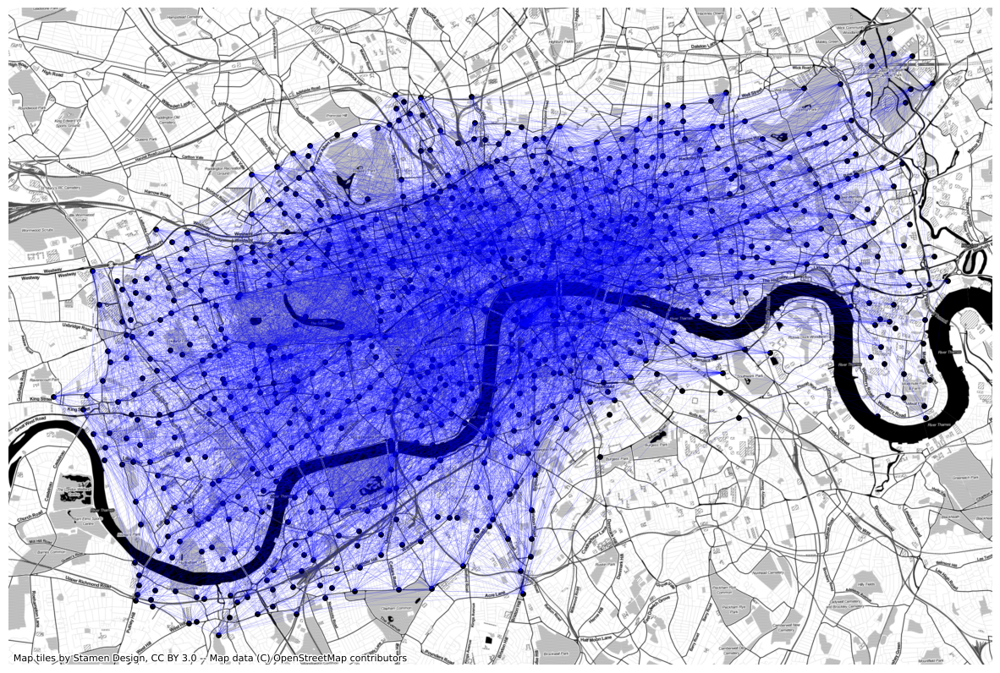

In [ ]:
# vizualize the edges (if needed)
vizualize_travels(travel_df[travel_df["Start Date"] == travel_df["Start Date"][0]], bike_points)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import kneighbors_graph

In [ ]:
def vizualize_knn_graph(bike_points, n_neighbors=[5, 50, 150], rows=1, cols=len([5, 50, 150])):
  
  bike_points = bike_points.to_crs("EPSG:27700")

  knn_graph_dict = {}

  for i, n in enumerate(n_neighbors):

    # create knn graph
    A = kneighbors_graph(bike_points[["lat", "lon"]], n, mode='connectivity', include_self=True)
    sources, targets = A.nonzero()
    knn_graph = gpd.GeoDataFrame(geometry=[LineString([bike_points.iloc[s]["geometry"], bike_points.iloc[t]["geometry"]]) for s, t in zip(sources, targets)], crs='EPSG:27700')
    knn_graph

    knn_graph_dict[n] = knn_graph

  alpha_dict={0:1, 1:.1, 2:.01}

  fig, axes = plt.subplots(nrows=rows ,ncols=cols, figsize=(16,40))
  for i, n in enumerate(n_neighbors):

    # change the coordinate reference system for London

    _r= i//cols
    _c= i%cols

    knn_graph_dict[n].plot(ax=axes[_c], alpha=alpha_dict[i], edgecolor='b', linewidth=.5)
    bike_points.plot(ax=axes[_c], marker='o', color='black', markersize=.1)
    cx.add_basemap(ax=axes[_c], zoom=14, crs=knn_graph.crs, source=cx.providers.Stamen.Toner)
    axes[_c].set_title("k={}".format(n))
    axes[_c].axis('off')

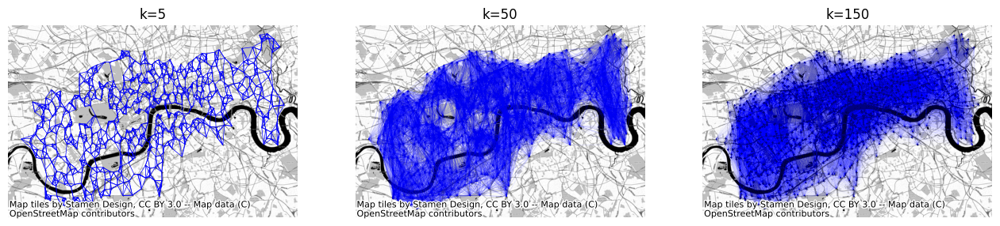

In [ ]:
vizualize_knn_graph(bike_points=bike_points, n_neighbors=[5, 50, 150], rows=1, cols=3)

In [ ]:
bike_points

,id,commonName,lat,lon,land_use,household_type_1,household_type_2,household_type_3,household_type_4,household_type_5,...,household_type_9,household_type_10,household_total,geometry,land_use_type_1,land_use_type_2,land_use_type_3,land_use_type_4,land_use_type_5,land_use_type_6
id,,,,,,,,,,,,,,,,,,,,,
1,1,"River Street , Clerkenwell",51.529163,-0.109970,Regional urbanity,27,65,177,99,17,...,60,5,657,POINT (-0.10997 51.52916),0,0,0,0,0,1
2,2,"Phillimore Gardens, Kensington",51.499606,-0.197574,Regional urbanity,19,34,107,111,51,...,55,14,563,POINT (-0.19757 51.49961),0,0,0,0,0,1
3,3,"Christopher Street, Liverpool Street",51.521283,-0.084605,Concentrated urbanity,21,10,402,89,11,...,24,2,935,POINT (-0.08460 51.52128),1,0,0,0,0,0
4,4,"St. Chad's Street, King's Cross",51.530059,-0.120973,Regional urbanity,31,23,221,82,25,...,44,5,624,POINT (-0.12097 51.53006),0,0,0,0,0,1
5,5,"Sedding Street, Sloane Square",51.493130,-0.156876,Metropolitan urbanity,16,60,236,64,16,...,56,5,663,POINT (-0.15688 51.49313),0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,850,"Brandon Street, Walworth",51.489102,-0.091548,Local urbanity,63,43,170,136,48,...,61,19,688,POINT (-0.09155 51.48910),0,0,0,1,0,0
851,851,"The Blue, Bermondsey",51.492221,-0.062513,Local urbanity,57,86,168,162,33,...,53,28,824,POINT (-0.06251 51.49222),0,0,0,1,0,0
852,852,"Coomer Place, West Kensington",51.483570,-0.202038,Regional urbanity,20,47,212,127,35,...,70,14,820,POINT (-0.20204 51.48357),0,0,0,0,0,1


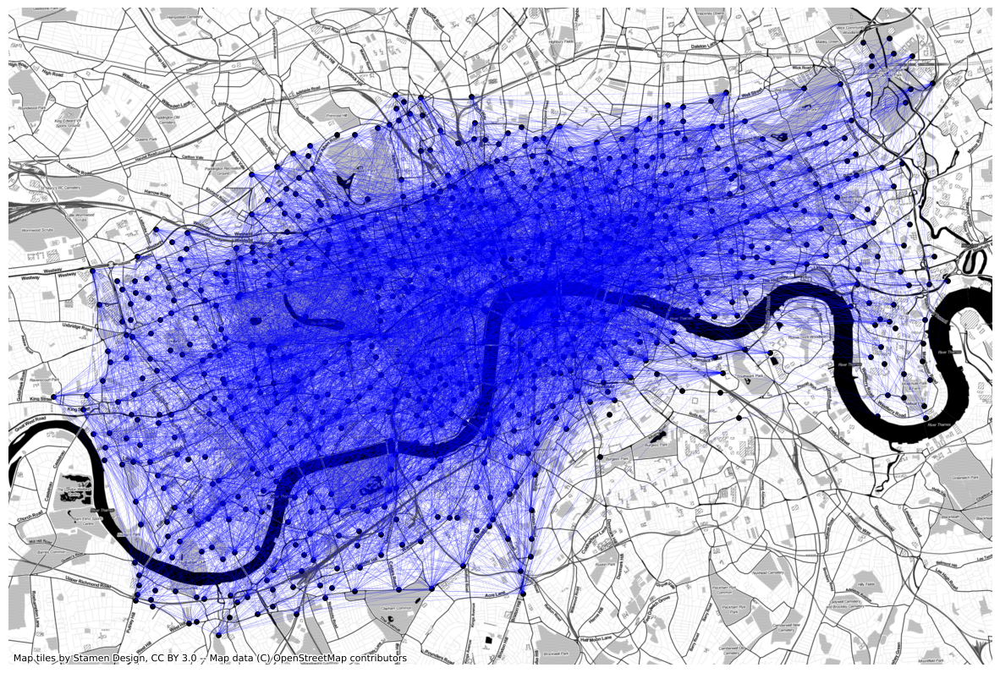

In [ ]:
# vizualize the edges (if needed)
vizualize_travels(travel_df[travel_df["Start Date"] == travel_df["Start Date"][0]], bike_points)

### 7. Targets - Weather labels (labels / graph embeddings) - you can skip

#### 7.1. Weather (blended)

In [ ]:
# assumed that the weather data is also mounted in Google Drive in the previous section for G_dist.pickle
# the data is stored in /content/drive/MyDrive/01 data/weather_data

# set a directory for weather data (non-blended)
weather_dir = "/content/drive/MyDrive/01 data/weather_data_blended/"

# extract the names of necessary files as a list
txt_list = os.listdir(weather_dir)
txt_list = [x for x in txt_list if re.match("[A-Z]{2}_STAID[0-9]{6}.txt", x)]

# make a dictionary to store the parsed data
txt_dict = {txt[:2]: {"name": txt_list[i]} for i, txt in enumerate(txt_list)}

In [ ]:
# create a date list from G_dict
date_list = list(G_dict.keys())

In [ ]:
# initiate an empty pd.DataFrame
weather_df = pd.DataFrame({"date":[]})

# parse over files and store them in the txt_dict
for txt in txt_list:
  
  # get the name of variable
  val = txt[:2]

  # parse the txt and convert it into pd.DataFrame
  val_df = pd.read_csv(os.path.join(weather_dir, txt), skiprows=19)

  # clean-up the name of columns (getting rid of whitespaces)
  val_df.columns = val_df.columns.str.strip()

  # filter the date only for those in date_list
  val_df['DATE'] = pd.to_datetime(val_df['DATE'], format='%Y%m%d', errors='coerce').dt.strftime('%Y-%m-%d')
  val_df = val_df[val_df['DATE'].isin(date_list)]

  # insert the DATE and variable
  weather_df["date"] = val_df["DATE"]

  # insert the output and convert it as numeric
  weather_df[val]    = pd.to_numeric(val_df[val], downcast="float")

# filter for only non-na rows
weather_df = weather_df[-(pd.isna(weather_df['date']))]

In [ ]:
# convert okta of cloud coverage into percentile
weather_df["CC"] *= 12.5

# categorise weather
weather_df["rainy"]  =  (weather_df["RR"] >= 0.1).astype(int)
weather_df["sunny"]  = ((weather_df["RR"] <  0.1) & (weather_df["CC"] <= 20.0)).astype(int)
weather_df["cloudy"] = ((weather_df["RR"] <  0.1) & (weather_df["CC"] >  20.0)).astype(int)

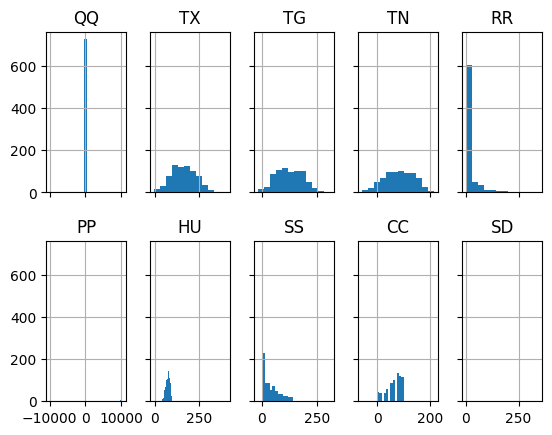

In [ ]:
fig, ax = plt.subplots(2, 5, sharex='col', sharey='row')

m=0
for i in range(2):
    for j in range(5):
      
      weather_df.hist(column = weather_df.columns[m+1], bins = 12, ax=ax[i,j])
      m+=1

In [ ]:
# normalize columns
weather_df[weather_df.columns[1:-3]] = weather_df[weather_df.columns[1:-3]].apply(lambda x: ((x - x.mean())/x.std()))

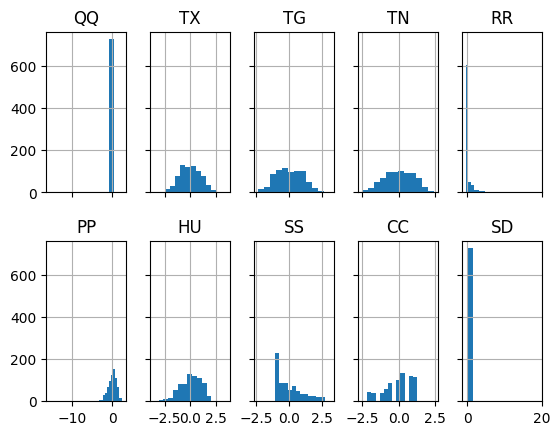

In [ ]:
fig, ax = plt.subplots(2, 5, sharex='col', sharey='row')

m=0
for i in range(2):
    for j in range(5):
      
      weather_df.hist(column = weather_df.columns[m+1], bins = 12, ax=ax[i,j])
      m+=1

In [ ]:
weather_df

,date,QQ,TX,TG,TN,RR,PP,HU,SS,CC,SD,rainy,sunny,cloudy
15341,2021-01-01,-0.109676,-1.641547,-1.826445,-1.777568,-0.280618,-0.473846,1.593554,-1.053114,1.262256,-0.052378,1,0,0
15342,2021-01-02,-0.108149,-1.539382,-1.625019,-1.470062,-0.434064,-0.047607,0.836310,-0.656512,0.834671,-0.052378,0,0,1
15343,2021-01-03,-0.085253,-1.612357,-1.507521,-1.343441,-0.382915,0.110993,0.920448,-0.894473,1.262256,-0.052378,1,0,0
15344,2021-01-04,-0.092885,-1.729118,-1.390022,-0.999757,-0.434064,0.299331,0.583896,-1.053114,1.262256,-0.052378,0,0,1
15345,2021-01-05,-0.108149,-1.510191,-1.524306,-1.144466,-0.331766,0.358806,0.583896,-1.053114,1.262256,-0.052378,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16066,2022-12-27,-0.106623,-0.649081,-0.936814,-1.126377,1.151548,0.279506,1.088725,-0.920913,0.407085,-0.052378,1,0,0
16067,2022-12-28,-0.115781,-0.970173,-0.584319,-0.439009,0.486614,-1.445274,1.341139,-1.053114,1.262256,-0.052378,1,0,0
16068,2022-12-29,-0.095938,-0.342585,-0.567533,-0.004881,-0.280618,-1.534486,0.079067,-0.656512,-0.448086,-0.052378,1,0,0
16069,2022-12-30,-0.112729,-0.357180,-0.500392,-0.656073,0.026275,-1.921075,0.920448,-1.026674,0.834671,-0.052378,1,0,0


#### 7.2. Weekend and Holiday

In [ ]:
# get bank holidays from the API
response = requests.get("https://www.gov.uk/bank-holidays.json")

holidays = pd.DataFrame(response.json()["england-and-wales"]["events"])
holidays['date'] = pd.to_datetime(holidays['date'])

In [ ]:
# create dummy variables for weekends and holidays
date_list = pd.to_datetime(date_list).to_series()
date_list = pd.DataFrame({"date":date_list,
                          "day_of_week": date_list.dt.day_name()})

date_list = date_list.merge(holidays, left_on="date", right_on="date", how="left")
date_list["weekend"] = date_list["day_of_week"].apply(lambda x: x in ["Saturday", "Sunday"])
date_list["weekend"] = date_list["weekend"].apply(int)

date_list["holiday"] = pd.isna(date_list["title"])
date_list["holiday"] = date_list["holiday"] == False
date_list["holiday"] = date_list["holiday"].apply(int)

# combine the column of weekened and holiday (take OR)
date_list["weekend_or_holiday"] = date_list["weekend"] | date_list["holiday"]

# drop unnecessary columns
date_list.drop(["weekend", "holiday", "day_of_week", "title", "notes", "bunting"], axis=1, inplace=True)

# convert datetime into string
date_list["date"] = date_list["date"].dt.strftime('%Y-%m-%d')

In [ ]:
# merge weekend_or_holiday into the weather_df
weather_df = weather_df.merge(date_list)

In [ ]:
weather_df

,date,QQ,TX,TG,TN,RR,PP,HU,SS,CC,SD,rainy,sunny,cloudy,weekend_or_holiday
0,2021-01-01,-0.109676,-1.641547,-1.826445,-1.777568,-0.280618,-0.473846,1.593554,-1.053114,1.262256,-0.052378,1,0,0,1
1,2021-01-02,-0.108149,-1.539382,-1.625019,-1.470062,-0.434064,-0.047607,0.836310,-0.656512,0.834671,-0.052378,0,0,1,1
2,2021-01-03,-0.085253,-1.612357,-1.507521,-1.343441,-0.382915,0.110993,0.920448,-0.894473,1.262256,-0.052378,1,0,0,1
3,2021-01-04,-0.092885,-1.729118,-1.390022,-0.999757,-0.434064,0.299331,0.583896,-1.053114,1.262256,-0.052378,0,0,1,0
4,2021-01-05,-0.108149,-1.510191,-1.524306,-1.144466,-0.331766,0.358806,0.583896,-1.053114,1.262256,-0.052378,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
725,2022-12-27,-0.106623,-0.649081,-0.936814,-1.126377,1.151548,0.279506,1.088725,-0.920913,0.407085,-0.052378,1,0,0,1
726,2022-12-28,-0.115781,-0.970173,-0.584319,-0.439009,0.486614,-1.445274,1.341139,-1.053114,1.262256,-0.052378,1,0,0,0
727,2022-12-29,-0.095938,-0.342585,-0.567533,-0.004881,-0.280618,-1.534486,0.079067,-0.656512,-0.448086,-0.052378,1,0,0,0
728,2022-12-30,-0.112729,-0.357180,-0.500392,-0.656073,0.026275,-1.921075,0.920448,-1.026674,0.834671,-0.052378,1,0,0,0


In [ ]:
#weather_df = weather_df[2:732]

In [ ]:
weather_df[["rainy","sunny","cloudy","weekend_or_holiday"]].apply(sum,axis=0)

rainy                 322
sunny                  75
cloudy                333
weekend_or_holiday    227
dtype: int64

In [ ]:
weather_df[["rainy","sunny","cloudy","weekend_or_holiday"]].groupby("weekend_or_holiday").sum()

,rainy,sunny,cloudy
weekend_or_holiday,,,
0,224,51,228
1,98,24,105


array([[<Axes: title={'center': 'rainy'}>,
        <Axes: title={'center': 'sunny'}>],
       [<Axes: title={'center': 'cloudy'}>,
        <Axes: title={'center': 'weekend_or_holiday'}>]], dtype=object)

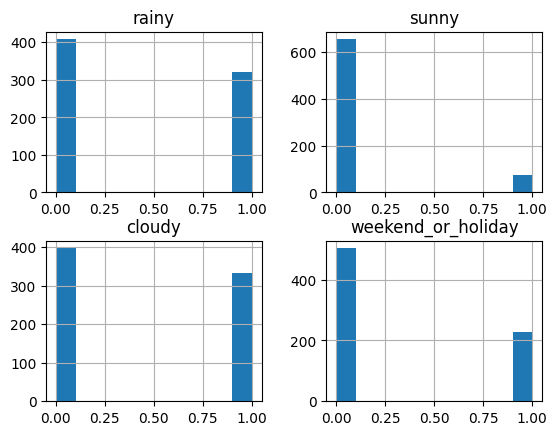

In [ ]:
weather_df[["rainy","sunny","cloudy","weekend_or_holiday"]].hist()

In [ ]:
weather_df["sunny_weekend"] =  weather_df["sunny"] * weather_df["weekend_or_holiday"]
weather_df["cloudy_weekend"]= weather_df["cloudy"] * weather_df["weekend_or_holiday"]
weather_df["rainy_weekend"] =  weather_df["rainy"] * weather_df["weekend_or_holiday"]

weather_df["sunny_weekday"] =  weather_df["sunny"] * (1 - weather_df["weekend_or_holiday"])
weather_df["cloudy_weekday"]= weather_df["cloudy"] * (1 - weather_df["weekend_or_holiday"])
weather_df["rainy_weekday"] =  weather_df["rainy"] * (1 - weather_df["weekend_or_holiday"])

In [ ]:
weather_df[["sunny_weekend", "cloudy_weekend", "rainy_weekend", "sunny_weekday", "cloudy_weekday", "rainy_weekday"]]

,sunny_weekend,cloudy_weekend,rainy_weekend,sunny_weekday,cloudy_weekday,rainy_weekday
0,0,0,1,0,0,0
1,0,1,0,0,0,0
2,0,0,1,0,0,0
3,0,0,0,0,1,0
4,0,0,0,0,0,1
...,...,...,...,...,...,...
725,0,0,1,0,0,0
726,0,0,0,0,0,1
727,0,0,0,0,0,1
728,0,0,0,0,0,1


In [ ]:
targets_dict = weather_df.groupby("date")[["TN","SS","RR","TG","PP","SD","HU","QQ","TX","CC","sunny","cloudy","rainy","weekend_or_holiday", "sunny_weekend", "cloudy_weekend", "rainy_weekend", "sunny_weekday", "cloudy_weekday", "rainy_weekday"]] \
                         .apply(lambda x : x.to_dict("records")) \
                         .to_frame("targets") \
                         .reset_index() \
                         .to_dict("index")
list(targets_dict.items())[:2]

[(0,
  {'date': '2021-01-01',
   'targets': [{'TN': -1.7775684595108032,
     'SS': -1.0531136989593506,
     'RR': -0.28061753511428833,
     'TG': -1.8264451026916504,
     'PP': -0.4738459587097168,
     'SD': -0.0523783303797245,
     'HU': 1.5935535430908203,
     'QQ': -0.10967563092708588,
     'TX': -1.6415472030639648,
     'CC': 1.2622562646865845,
     'sunny': 0,
     'cloudy': 0,
     'rainy': 1,
     'weekend_or_holiday': 1,
     'sunny_weekend': 0,
     'cloudy_weekend': 0,
     'rainy_weekend': 1,
     'sunny_weekday': 0,
     'cloudy_weekday': 0,
     'rainy_weekday': 0}]}),
 (1,
  {'date': '2021-01-02',
   'targets': [{'TN': -1.4700615406036377,
     'SS': -0.6565119028091431,
     'RR': -0.43406379222869873,
     'TG': -1.6250193119049072,
     'PP': -0.047607239335775375,
     'SD': -0.0523783303797245,
     'HU': 0.8363102674484253,
     'QQ': -0.10814919322729111,
     'TX': -1.5393816232681274,
     'CC': 0.8346706032752991,
     'sunny': 0,
     'cloudy': 1,
   

In [ ]:
# save targets_dict
with open("/content/targets_dict.pickle", 'wb') as pickle_file:
    pickle.dump(targets_dict, pickle_file)

In [ ]:
weather_df.query("rainy==1 & weekend_or_holiday==0")

,date,QQ,TX,TG,TN,RR,PP,HU,SS,CC,...,rainy,sunny,cloudy,weekend_or_holiday,sunny_weekend,cloudy_weekend,rainy_weekend,sunny_weekday,cloudy_weekday,rainy_weekday
4,2021-01-05,-0.108149,-1.510191,-1.524306,-1.144466,-0.331766,0.358806,0.583896,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
10,2021-01-11,-0.100517,-1.101529,-1.339666,-1.596682,1.100399,0.140731,0.836310,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
11,2021-01-12,-0.080673,-0.940983,-0.819316,-0.402832,-0.280618,-0.226033,1.172863,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
12,2021-01-13,-0.097464,-1.524786,-1.188597,-1.397707,2.583713,0.190293,1.761830,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
13,2021-01-14,-0.112729,-1.802093,-1.188597,-0.692250,0.588911,0.021780,1.677692,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
720,2022-12-22,-0.115781,-0.371775,-0.567533,-0.420920,1.969928,-1.296586,1.509415,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
721,2022-12-23,-0.103570,-0.809627,-0.349322,-0.312388,0.793506,-1.365973,1.172863,-0.841593,0.407085,...,1,0,0,0,0,0,0,0,0,1
726,2022-12-28,-0.115781,-0.970173,-0.584319,-0.439009,0.486614,-1.445274,1.341139,-1.053114,1.262256,...,1,0,0,0,0,0,0,0,0,1
727,2022-12-29,-0.095938,-0.342585,-0.567533,-0.004881,-0.280618,-1.534486,0.079067,-0.656512,-0.448086,...,1,0,0,0,0,0,0,0,0,1


In [ ]:
print(weather_df.query("rainy==1 & weekend_or_holiday==0").count()[0])
print(weather_df.query("rainy==1 & weekend_or_holiday==1").count()[0])

print(weather_df.query("sunny==1 & weekend_or_holiday==0").count()[0])
print(weather_df.query("sunny==1 & weekend_or_holiday==1").count()[0])

print(weather_df.query("cloudy==1 & weekend_or_holiday==0").count()[0])
print(weather_df.query("cloudy==1 & weekend_or_holiday==1").count()[0])

224
98
51
24
228
105


In [ ]:
(224+98+51+24+228+105)/2

365.0

### 8. Skip preprocessing for edges (you can upload the processed one from section 6)

In [2]:
# upload "G_dict.pickle"
#uploaded = files.upload()

#with open("/content/G_dict.pickle", 'rb') as pickle_file:
#  G_dict = pickle.load(pickle_file)

In [3]:
# alternatively, upload the file to Google Drive then mount your Google Drive storage
# Monut Google Drive - optional
drive.mount("/content/drive", force_remount=True)
with open("/content/drive/MyDrive/01 data/G_dict.pickle", "rb") as pickle_file:
  G_dict = pickle.load(pickle_file)

Mounted at /content/drive


### 9. Skip preprocessing for labels (you can upload the preprocessed one from section 7)

In [4]:
# upload "targets_dict.pickle"
#uploaded = files.upload()

#with open("/content/targets_dict.pickle", 'rb') as pickle_file:
#  targets_dict = pickle.load(pickle_file)

In [5]:
# alternatively, upload the file to Google Drive then mount your Google Drive storage
# Monut Google Drive - optional
drive.mount("/content/drive", force_remount=True)
with open("/content/drive/MyDrive/01 data/targets_dict.pickle", "rb") as pickle_file:
  targets_dict = pickle.load(pickle_file)

Mounted at /content/drive


### 10. Assignment Matrix

In [6]:
# create a function of getting an assignment matrix using spectral clustering
def get_assignment_matrix(G, n_clusters=100, affinity="nearest_neighbors", n_init=10, n_neighbors=10, return_category=False):

  # initialize an object of learning model for spectral clustering
  sc = SpectralClustering(n_clusters=n_clusters, affinity=affinity, n_init=n_init, n_neighbors=n_neighbors)
  oh = OneHotEncoder(categories="auto")

  # predict the category
  if affinity == "nearest_neighbors":
    # get the coordinates
    coords = np.array([(G.nodes[n]['lat'], G.nodes[n]['lon']) for n in list(G.nodes())])
    categories = sc.fit_predict(coords)
  
  elif affinity == "precomputed":
    # get the adjacency matrix in a dense form
    A = nx.adjacency_matrix(G).todense()
    categories = sc.fit_predict(A)

  else:
    raise ValueError("Affinity type is wrong.")

  if return_category:
    return categories

  # compute the assignment matrix using broadcasting
  #similarity_matrix = (categories[:, None] == categories[None, :]).astype(int)
  similarity_matrix = oh.fit_transform(categories.reshape(-1, 1)).toarray()

  # replace the diagonal with 1s
  #np.fill_diagonal(similarity_matrix, 1)

  return similarity_matrix

### 11. Dataset & Dataloader for PyTorch (Geometric)

Text(0, 0.5, 'Total number of travel records per day')

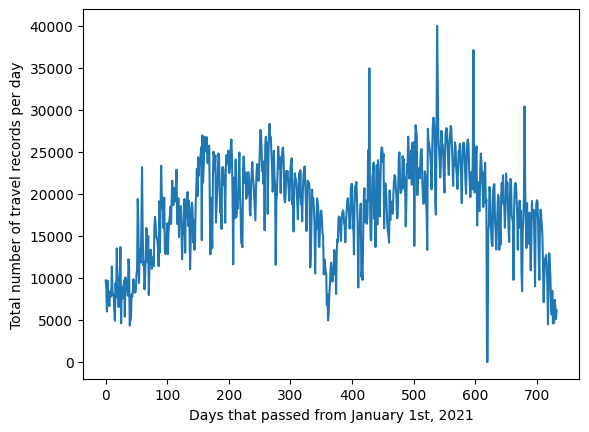

In [7]:
total_num_of_edges = [len(G_dict[date].edges()) for date in G_dict.keys()]

plt.plot(total_num_of_edges)

plt.xlabel("Days that passed from January 1st, 2021")
plt.ylabel("Total number of travel records per day")

In [8]:
# filter only for 2021 and omit outliers

out_of_sample_years = ['2020-12-30', '2020-12-31', '2023-01-01']
outliers = ['2022-03-03', '2022-06-21', '2022-06-22', '2022-08-19', '2022-09-10', '2022-09-11' ,'2022-11-10']

G_dict = {d:nx for d, nx in G_dict.items() if d not in out_of_sample_years + outliers}
targets_dict = {idx:dic for idx, dic in targets_dict.items() if dic['date'] not in out_of_sample_years + outliers}
targets_dict = {i:dic for i, dic in enumerate(targets_dict.values())}

In [9]:
# convert the dict into a pd.DataFrame
targets_dict_df = pd.DataFrame(data=[value_dict['targets'][0] for key, value_dict in targets_dict.items()], index=targets_dict.keys())

# removed unused variables
targets_dict_df.drop(["SS", "RR", "PP", "SD", "HU", "QQ", "CC"], axis=1, inplace=True)

In [10]:
# summarise sum, average, and sd
pd.DataFrame({"sum":targets_dict_df.sum(), "average":targets_dict_df.mean(), "sd":np.std(targets_dict_df)})

,sum,average,sd
TN,-4.270879,-0.005907,0.999763
TG,-5.158572,-0.007135,0.998874
TX,-5.687508,-0.007867,0.995966
sunny,74.000000,0.102351,0.303110
cloudy,329.000000,0.455048,0.497975
rainy,320.000000,0.442600,0.496694
weekend_or_holiday,225.000000,0.311203,0.462986
sunny_weekend,24.000000,0.033195,0.179146
cloudy_weekend,103.000000,0.142462,0.349523
rainy_weekend,98.000000,0.135546,0.342306


In [11]:
# get available device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [12]:
# create a dataset object
class CustomDataset(Dataset):
  def __init__(self, 
               G_dict=G_dict,
               targets_dict=targets_dict,
               node_embeddings="all",
               graph_features=None,
               graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                 'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
               n_clusters=100,
               n_init=10,
               n_neighbors=150,
               assignment=False,
               assignment_knn=False,
               category=False,
               category_knn=False,
               transform=None,
               pre_transform=None,
               device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    
    self.node_embeddings = node_embeddings
    self.graph_features = graph_features
    self.graph_embeddings = graph_embeddings
    self.device = device

    # for assignment matrix
    self.assignment = assignment
    self.assignment_knn = assignment_knn
    self.category = category
    self.category_knn = category_knn

    self.n_clusters = n_clusters
    self.n_init  = n_init
    self.n_neighbors = n_neighbors
      
    self.process_dir = "/content/drive/MyDrive/01 data/data/processed/"

    super().__init__("/content/drive/MyDrive/01 data/data", transform, pre_transform)
  
  @property
  def processed_file_names(self):
    return [f"data_{idx}.pt" for idx in range(723)]

  def _download(self):
    # collect G_dict and targets_dict (and other files where necessary)
    #G_dict = ... # path to G_dict, if not already loaded in SECTION 7
    #targets_dict = ... # path to targets_dict, if not already loaded in SECTION 9
    return

  def process(self):
    # this is currently implemented under the get function
    with tqdm(total=len(G_dict.keys())) as pbar:
      for idx in range(len(G_dict.keys())):
        G = G_dict[targets_dict[idx]["date"]]
        raw_data = convert.from_networkx(G)
        
        # set device
        data = Data()

        # get edge attributes
        data.edge_attr = torch.reshape(raw_data.count, (-1,1)).type(torch.float)
        # or 
        # data.edge_weight = ...
        
        # get edge indices
        data.edge_index = torch.reshape(raw_data.edge_index, (2,-1))
        
        # get targets (graph embeddings)
        targets = torch.tensor([targets_dict[idx]["targets"][0][v] for v in self.graph_embeddings], dtype=torch.float)
        #data.y = targets
        data.y = torch.reshape(targets, (1,-1))

        # get graph features
        if self.graph_features is not None:
          g_features = torch.tensor([targets_dict[idx]["targets"][0][v] for v in self.graph_features], dtype=torch.float)
          data.graph_features = torch.reshape(g_features, (-1, len(self.graph_features)))

        # Node embeddings - select which attribute from the Data object is used
        # you can stack multiple features together
        if self.node_embeddings == "all": 
          features = torch.stack((raw_data.household_type_1, 
                                  raw_data.household_type_2, 
                                  raw_data.household_type_3, 
                                  raw_data.household_type_4, 
                                  raw_data.household_type_5, 
                                  raw_data.household_type_6, 
                                  raw_data.household_type_7, 
                                  raw_data.household_type_8,
                                  raw_data.household_type_9,
                                  raw_data.household_type_10,   
                                  raw_data.land_use_type_1,
                                  raw_data.land_use_type_2,
                                  raw_data.land_use_type_3,
                                  raw_data.land_use_type_4,
                                  raw_data.land_use_type_5,
                                  raw_data.land_use_type_6), -1).type(torch.float)
          data.x = torch.reshape(features, (-1, 16))

        elif self.node_embeddings == "household_type":
          features = torch.stack((raw_data.household_type_1, 
                                  raw_data.household_type_2, 
                                  raw_data.household_type_3, 
                                  raw_data.household_type_4, 
                                  raw_data.household_type_5, 
                                  raw_data.household_type_6, 
                                  raw_data.household_type_7, 
                                  raw_data.household_type_8,
                                  raw_data.household_type_9,
                                  raw_data.household_type_10), -1)
          data.x = torch.reshape(features, (-1, 10))

        elif self.node_embeddings == "land_use_type":
          features = torch.stack((raw_data.land_use_type_1,
                                  raw_data.land_use_type_2,
                                  raw_data.land_use_type_3,
                                  raw_data.land_use_type_4,
                                  raw_data.land_use_type_5,
                                  raw_data.land_use_type_6), -1)
          data.x = torch.reshape(features, (-1, 6))
          
        else:
          raise ValueError("Invalid selection of node embeddings")

        # get coordinates
        coords = torch.stack((raw_data.lat,
                              raw_data.lon),-1)
        
        data.coords = torch.reshape(coords, (-1, 2))
        
        # create edge indices based on KNN
        if self.assignment or self.assignment_knn:
          data.edge_index_knn = torch_cluster.knn_graph(x=data.coords, k=self.n_neighbors, batch=data.batch, loop=True)

        
        if self.assignment:
          # get assignment matrix (original adjacency matrix based)

          data.assignment = torch.tensor(get_assignment_matrix(G,
                                                              n_clusters=self.n_clusters,
                                                              affinity="precomputed",
                                                              n_init=self.n_init)).type(torch.float).to(device)
                                                            
          data.assignment = torch.reshape(data.assignment, (-1, self.n_clusters))  

        if self.assignment_knn:
          # get assignment matrix (coordinates knn based)

          data.assignment_knn = torch.tensor(get_assignment_matrix(G,
                                                                  n_clusters=self.n_clusters,
                                                                  affinity="nearest_neighbors",
                                                                  n_init=self.n_init,
                                                                  n_neighbors=self.n_neighbors)).type(torch.float).to(device)
            
          data.assignment_knn = torch.reshape(data.assignment_knn, (-1, self.n_clusters))  

        if self.category:
          data.category = torch.tensor(get_assignment_matrix(G,
                                                            n_clusters=self.n_clusters,
                                                            affinity="precomputed",
                                                            n_init=self.n_init,
                                                            return_category=True)).type(torch.float).to(device)

        if self.category_knn:
          data.category_knn = torch.tensor(get_assignment_matrix(G,
                                                                n_clusters=self.n_clusters,
                                                                affinity="nearest_neighbors",
                                                                n_init=self.n_init,
                                                                n_neighbors=self.n_neighbors,
                                                                return_category=True)).type(torch.float).to(device)

        # validate data
        # https://pytorch-geometric.readthedocs.io/en/latest/get_started/introduction.html
        # scroll down to the section about data specifications
        data.validate(raise_on_error=True)
        
        torch.save(data, os.path.join(self.process_dir, f"data_{idx}.pt"))
        pbar.update(1)

  def get(self, idx):
    # load an example (one graph) from the dataset
    # assuming G_dict and targets_dict are available and already loaded
    data = torch.load(os.path.join(self.process_dir, f"data_{idx}.pt"))
    data.validate(raise_on_error=True)
    data.to(self.device)
    return data
  
  def len(self):
    # return the total number of examples in this dataset
    return len(G_dict.keys())
  
  def __repr__(self):
    return "{}()".format(self.__class__.__name__)

In [13]:
def weight(data):
  y = data.y
  # sunny_weekend
  if y[0][0]:
    return 1/24
  # cloudy_weekend
  elif y[0][1]:
    return 1/103
  # rainy_weekend
  elif y[0][2]:
    return 1/98
  # sunny_weekday
  elif y[0][3]:
    return 1/50
  # cloudy_weekday
  elif y[0][4]:
    return 1/226
  # rainy_weekday
  elif y[0][5]:
    return 1/222

In [14]:
# create a function that generatws data loaders for training and testing
def data_loader(dataset, split_ratio, batch_size, random_seed=42, stratify=False, shuffle=False, drop_last=False):
  # split_ratio is a list of fractions [train, valid, test]
  # random_seed is an integer
  assert len(split_ratio) in [2,3], "split_ratio must be a list of either length 2 or 3"
  assert sum(split_ratio) == 1, "Proportion of train, valid and test sets should sum to 1"

  # if only training and testing sets (no validation set)
  if len(split_ratio) == 2:
    train, test = random_split(dataset, split_ratio, generator=torch.Generator().manual_seed(random_seed))
    
    if stratify:
      sample_weights = [weight(data) for data in train]
      sampler = WeightedRandomSampler(sample_weights, num_samples=len(train), replacement=True, generator=torch.Generator().manual_seed(random_seed))
      trainloader = DataLoader(train, batch_size=batch_size, shuffle=shuffle, sampler=sampler, drop_last=drop_last)
    
    else:
      trainloader = DataLoader(train, batch_size=batch_size, shuffle=shuffle, drop_last=drop_last)

    testloader = DataLoader(test, batch_size=batch_size, drop_last=drop_last)

    return trainloader, testloader
  
  # if training, validation and testing sets
  elif len(split_ratio) == 3:
    train, valid, test = random_split(dataset, split_ratio, generator=torch.Generator().manual_seed(random_seed))

    if stratify:
      sample_weights = [weight(data) for data in train]
      sampler = WeightedRandomSampler(sample_weights, num_samples=len(train), replacement=True, generator=torch.Generator().manual_seed(random_seed))
      trainloader = DataLoader(train, batch_size=batch_size, shuffle=shuffle, sampler=sampler, drop_last=drop_last)
    
    else:
      trainloader = DataLoader(train, batch_size=batch_size, shuffle=shuffle, drop_last=drop_last)

    validloader = DataLoader(valid, batch_size=batch_size, drop_last=drop_last)
    testloader = DataLoader(test, batch_size=batch_size, drop_last=drop_last)

    return trainloader, validloader, testloader

### 12. Train & test framework

In [17]:
def train(model, loader, device=device, edge_weighted=False, mincut_pool=False, knn_based=False, concat=False):
  model.train()

  overall_loss  = 0
  overall_acc   = 0
  overall_f1    = 0
  num_of_sample = 0 

  for data in loader:#tqdm(loader, total=len(loader)):

    data = data.to(device)
    y = data.y

    params = {"x": data.x,
              "edge_index": data.edge_index,
              "batch": data.batch}

    if edge_weighted:
      params["edge_attr"] = data.edge_attr

    if mincut_pool:
      if knn_based:
        params["s"] = data.assignment_knn
      else:
        params["s"] = data.assignment
    
    if concat:
      params["graph_features"] = data.graph_features

    out = model(**params)
    loss=criterion(out, y)    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    pred = torch.nn.functional.softmax(out, dim=1).argmax(dim=1, keepdim=True)
    pred = torch.zeros_like(out).scatter_(1, pred, 1.)

    acc  = Accuracy(task="multiclass", num_classes=6).to(device)

    f1   = F1Score(task="multiclass", average='macro', num_classes=6).to(device)

    overall_loss += y.shape[0] * loss.item()
    overall_acc  += y.shape[0] * acc(pred.argmax(dim=1), y.argmax(dim=1)).item() 
    overall_f1   += y.shape[0] * f1(pred.argmax(dim=1), y.argmax(dim=1)).item()

    num_of_sample += y.shape[0]

  overall_loss = overall_loss / num_of_sample
  overall_acc  = overall_acc / num_of_sample
  overall_f1   = overall_f1 / num_of_sample

    #overall_loss += loss.item()
    #overall_acc  += acc(pred, y).item()
    #overall_f1   += f1(pred, y).item()

  #overall_loss = overall_loss / len(loader)
  #overall_acc  = overall_acc / len(loader)
  #overall_f1   = overall_f1 / len(loader)

  return overall_loss, overall_acc, overall_f1

In [18]:
def test(model, loader, device=device, edge_weighted=False, mincut_pool=False, knn_based=False, concat=False):
  model.eval()

  overall_loss = 0
  overall_acc  = 0
  overall_f1   = 0
  num_of_sample = 0 

  for data in loader: #tqdm(loader, total=len(loader)):
    data = data.to(device)
    y = data.y

    params = {"x": data.x,
              "edge_index": data.edge_index,
              "batch": data.batch}

    if edge_weighted:
      params["edge_attr"] = data.edge_attr

    if mincut_pool:
      if knn_based:
        params["s"] = data.assignment_knn
      else:
        params["s"] = data.assignment

    if concat:
      params["graph_features"] = data.graph_features

    out = model(**params)
    loss = criterion(out, y)

    pred = torch.nn.functional.softmax(out, dim=1).argmax(dim=1, keepdim=True)
    pred = torch.zeros_like(out).scatter_(1, pred, 1.)
    
    acc = Accuracy(task="multiclass", num_classes=6).to(device)
    f1  = F1Score(task="multiclass", average='macro', num_classes=6).to(device)

    overall_loss += y.shape[0] * loss.item()
    overall_acc  += y.shape[0] * acc(pred.argmax(dim=1), y.argmax(dim=1)).item() 
    overall_f1   += y.shape[0] * f1(pred.argmax(dim=1), y.argmax(dim=1)).item()

    num_of_sample += y.shape[0]

  overall_loss = overall_loss / num_of_sample
  overall_acc  = overall_acc / num_of_sample
  overall_f1   = overall_f1 / num_of_sample

    #overall_loss += loss.item()
    #overall_acc  += acc(pred, y).item()
    #overall_f1   += f1(pred, y).item()

  #overall_loss = overall_loss / len(loader)
  #overall_acc  = overall_acc / len(loader)
  #overall_f1   = overall_f1 / len(loader)

  return overall_loss, overall_acc, overall_f1

### 13. GNN with training

#### GCN (no concatination as baseline)

##### I. Model

In [19]:
class GCN(nn.Module):
  def __init__(self, input_dim, hidden_dim_1, hidden_dim_2, hidden_dim_3, out_dim):
    super(GCN, self).__init__()
    torch.manual_seed(12345)
    self.conv1 = GCNConv(input_dim, hidden_dim_1)
    self.conv2 = GCNConv(hidden_dim_1, hidden_dim_2)
    self.lin1 = Linear(hidden_dim_2, hidden_dim_3)
    self.bnorm = BatchNorm1d(hidden_dim_3)
    self.lin2 = Linear(hidden_dim_3, out_dim)
  
  def forward(self, x, edge_index, batch):
    x = self.conv1(x, edge_index)
    x = x.relu()

    x = F.dropout(x, training=self.training)
    x = self.conv2(x, edge_index)
    x = x.relu()

    # graph pooling
    x = global_mean_pool(x, batch)
    x = F.dropout(x, training=self.training)
    x = self.lin1(x)
    x = x.relu()

    x = F.dropout(x, training=self.training)
    x = self.lin2(x)

    return (x) 

In [20]:
gcn = GCN(input_dim=16,
          hidden_dim_1=16,
          hidden_dim_2=12,
          hidden_dim_3=10,
          out_dim=6).to(device)
          
optimizer = optim.Adam(gcn.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [29]:
# load the pre-trained model
gcn.load_state_dict(torch.load("/content/drive/MyDrive/01 data/data/trained/GCN_baseline.pth", map_location=device))

<All keys matched successfully>

##### II. Training

In [30]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=100,
                        n_init=10,
                        n_neighbors=150,
                        assignment=False,
                        assignment_knn=False,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn, train_loader, concat=False)
  valid_loss, valid_acc, valid_f1 = test(gcn, valid_loader, concat=False)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Valid Acc: {valid_acc:.4f}, Valid F1: {valid_f1:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

In [ ]:
gcn

GCN(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (lin1): Linear(in_features=12, out_features=10, bias=True)
  (bnorm): BatchNorm1d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [ ]:
records_df = pd.DataFrame(train_records)

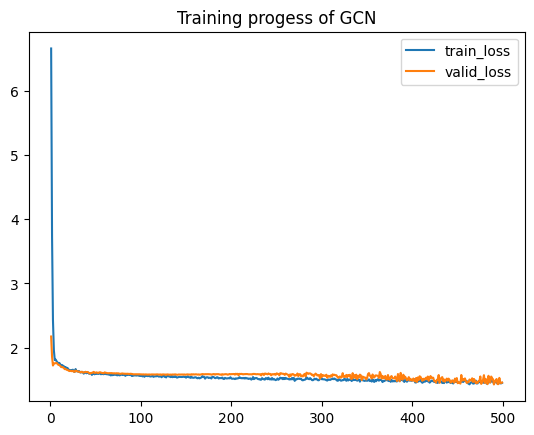

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN")
plt.show()

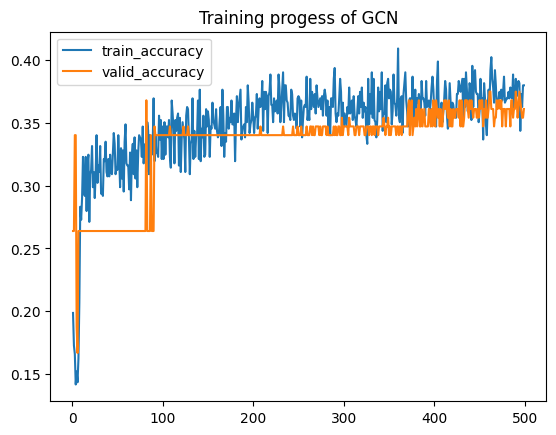

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN")
plt.show()

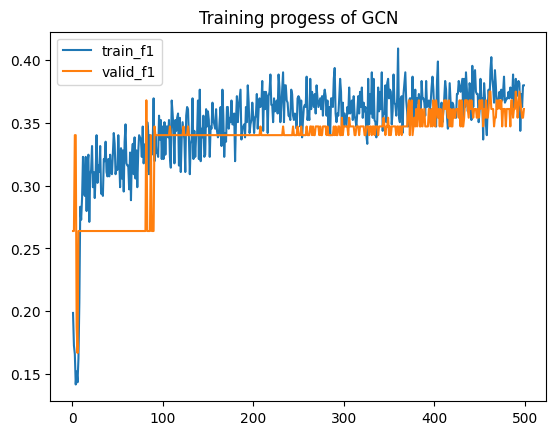

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_f1"], label = "train_f1")
ax.plot(records_df.index, records_df["valid_f1"], label = "valid_f1")
ax.legend()

plt.title("Training progess of GCN")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn.state_dict(), "/content/drive/MyDrive/01 data/data/trained/GCN_baseline.pth")

In [ ]:
# save records
with open("/content/drive/MyDrive/01 data/data/trained/train_records_GCN_baseline.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

#### GCN

##### I. Model

In [ ]:
class GCN(nn.Module):
  def __init__(self, input_dim, hidden_dim_1, hidden_dim_2, hidden_dim_3, concat_dim, out_dim):
    super(GCN, self).__init__()
    torch.manual_seed(12345)
    self.conv1 = GCNConv(input_dim, hidden_dim_1)
    self.conv2 = GCNConv(hidden_dim_1, hidden_dim_2)
    self.lin1 = Linear(hidden_dim_2 + concat_dim, hidden_dim_3)
    self.lin2 = Linear(hidden_dim_3, out_dim)
  
  def forward(self, x, edge_index, graph_features, batch):
    x = self.conv1(x, edge_index)
    x = x.relu()

    x = F.dropout(x, training=self.training)
    x = self.conv2(x, edge_index)
    x = x.relu()

    # graph pooling
    x = global_mean_pool(x, batch)
    x = torch.concat((x, graph_features), dim=1)

    x = F.dropout(x, training=self.training)
    x = self.lin1(x)
    x = x.relu()
    
    x = self.lin2(x)

    return (x) 

In [ ]:
gcn = GCN(input_dim=16,
          hidden_dim_1=16,
          hidden_dim_2=12,
          hidden_dim_3=10,
          concat_dim=3,
          out_dim=6).to(device)
          
optimizer = optim.Adam(gcn.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
# load the pre-trained model
#gcn.load_state_dict(torch.load("/content/drive/MyDrive/01 data/GCN.pth", map_location=device))

##### II. Training

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=100,
                        n_init=10,
                        n_neighbors=150,
                        assignment=False,
                        assignment_knn=False,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

Processing...


  0%|          | 0/723 [00:00<?, ?it/s]

Done!


In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn, train_loader, concat=True)
  valid_loss, valid_acc, valid_f1 = test(gcn, valid_loader, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 6.4576, Valid Loss: 1.9812, Train Acc: 0.2694, Valid Acc: 0.3403
### Epoch: 002 ###
Train Loss: 2.5235, Valid Loss: 1.7628, Train Acc: 0.2176, Valid Acc: 0.1389
### Epoch: 003 ###
Train Loss: 1.9316, Valid Loss: 1.5889, Train Acc: 0.2107, Valid Acc: 0.3056
### Epoch: 004 ###
Train Loss: 1.7135, Valid Loss: 1.6042, Train Acc: 0.2642, Valid Acc: 0.3472
### Epoch: 005 ###
Train Loss: 1.6597, Valid Loss: 1.6378, Train Acc: 0.3143, Valid Acc: 0.3403
### Epoch: 006 ###
Train Loss: 1.6409, Valid Loss: 1.6091, Train Acc: 0.2936, Valid Acc: 0.3194
### Epoch: 007 ###
Train Loss: 1.6402, Valid Loss: 1.6149, Train Acc: 0.3143, Valid Acc: 0.3194
### Epoch: 008 ###
Train Loss: 1.6609, Valid Loss: 1.6226, Train Acc: 0.2936, Valid Acc: 0.3333
### Epoch: 009 ###
Train Loss: 1.6314, Valid Loss: 1.6104, Train Acc: 0.3057, Valid Acc: 0.3056
### Epoch: 010 ###
Train Loss: 1.6163, Valid Loss: 1.6133, Train Acc: 0.3212, Valid Acc: 0.2986
### Epoch: 011 ###
Train Loss: 1.6324, V

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn, train_loader, concat=True)
  valid_loss, valid_acc, valid_f1 = test(gcn, valid_loader, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 11.4304, Valid Loss: 4.5245, Train Acc: 0.0915, Valid Acc: 0.1042
### Epoch: 002 ###
Train Loss: 4.1439, Valid Loss: 1.7868, Train Acc: 0.0984, Valid Acc: 0.2222
### Epoch: 003 ###
Train Loss: 2.1541, Valid Loss: 1.7790, Train Acc: 0.1917, Valid Acc: 0.2639
### Epoch: 004 ###
Train Loss: 1.8984, Valid Loss: 1.7734, Train Acc: 0.2383, Valid Acc: 0.2639
### Epoch: 005 ###
Train Loss: 1.7997, Valid Loss: 1.7685, Train Acc: 0.2470, Valid Acc: 0.2639
### Epoch: 006 ###
Train Loss: 1.7981, Valid Loss: 1.7637, Train Acc: 0.2504, Valid Acc: 0.2639
### Epoch: 007 ###
Train Loss: 1.7822, Valid Loss: 1.7585, Train Acc: 0.2936, Valid Acc: 0.2639
### Epoch: 008 ###
Train Loss: 1.7410, Valid Loss: 1.7535, Train Acc: 0.2919, Valid Acc: 0.2639
### Epoch: 009 ###
Train Loss: 1.7374, Valid Loss: 1.7486, Train Acc: 0.2953, Valid Acc: 0.2639
### Epoch: 010 ###
Train Loss: 1.7326, Valid Loss: 1.7442, Train Acc: 0.3057, Valid Acc: 0.2639
### Epoch: 011 ###
Train Loss: 1.7208, 

In [ ]:
gcn

GCN(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [ ]:
records_df = pd.DataFrame(train_records)

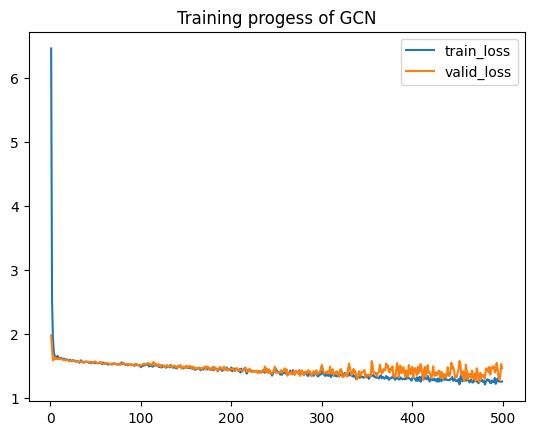

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN")
plt.show()

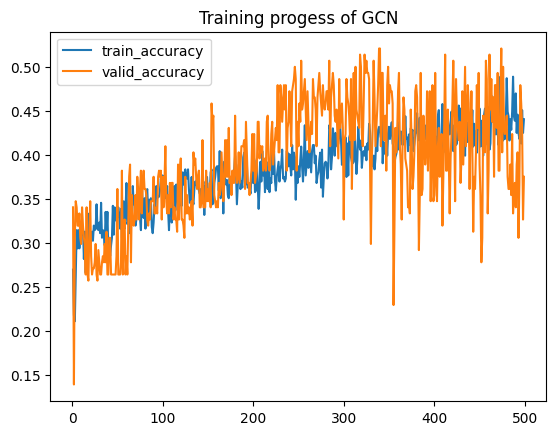

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN")
plt.show()

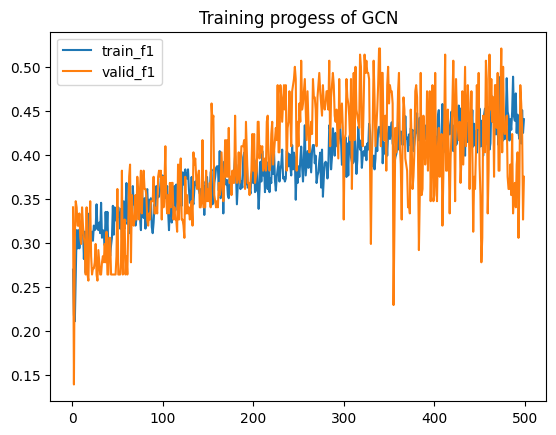

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_f1"], label = "train_f1")
ax.plot(records_df.index, records_df["valid_f1"], label = "valid_f1")
ax.legend()

plt.title("Training progess of GCN")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn.state_dict(), "/content/drive/MyDrive/01 data/data/trained/GCN.pth")

In [ ]:
# save records
with open("/content/drive/MyDrive/01 data/data/trained/train_records_GCN.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

#### GCN + edge weights

##### I. Model

In [ ]:
class GCN_weighted(torch.nn.Module):
  def __init__(self, input_dim, hidden_dim_1, hidden_dim_2, hidden_dim_3, concat_dim, out_dim):
    super(GCN_weighted, self).__init__()
    torch.manual_seed(12345)
    self.conv1 = GCNConv(input_dim, hidden_dim_1)
    self.conv2 = GCNConv(hidden_dim_1, hidden_dim_2)
    self.lin1 = Linear(hidden_dim_2 + concat_dim, hidden_dim_3)
    self.lin2 = Linear(hidden_dim_3, out_dim)
  
  def forward(self, x, edge_index, graph_features, edge_attr, batch):
    x = self.conv1(x, edge_index, edge_weight=edge_attr)
    x = x.relu()

    x = F.dropout(x, training=self.training)
    x = self.conv2(x, edge_index, edge_weight=edge_attr)
    x = x.relu()

    # graph pooling
    x = global_mean_pool(x, batch) 
    x = torch.concat((x, graph_features), dim=1)

    x = F.dropout(x, training=self.training)
    x = self.lin1(x)
    x = x.relu()

    x = self.lin2(x)

    return (x)

In [ ]:
gcn_weighted = GCN_weighted(input_dim=16,
                            hidden_dim_1=16,
                            hidden_dim_2=12,
                            hidden_dim_3=10,
                            concat_dim=3,
                            out_dim=6).to(device)
optimizer = optim.Adam(gcn_weighted.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
gcn_weighted

GCN_weighted(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

##### II. Training

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=100,
                        n_init=10,
                        n_neighbors=150,
                        assignment=False,
                        assignment_knn=False,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

Processing...


  0%|          | 0/723 [00:00<?, ?it/s]

Done!


In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_weighted, train_loader, edge_weighted=True, concat=True)
  valid_loss, valid_acc, valid_f1 = test(gcn_weighted, valid_loader, edge_weighted=True, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 6.3546, Valid Loss: 1.9782, Train Acc: 0.2712, Valid Acc: 0.3403
### Epoch: 002 ###
Train Loss: 2.4979, Valid Loss: 1.7445, Train Acc: 0.2211, Valid Acc: 0.1389
### Epoch: 003 ###
Train Loss: 1.9238, Valid Loss: 1.5862, Train Acc: 0.2107, Valid Acc: 0.3264
### Epoch: 004 ###
Train Loss: 1.7176, Valid Loss: 1.6051, Train Acc: 0.2677, Valid Acc: 0.3403
### Epoch: 005 ###
Train Loss: 1.6585, Valid Loss: 1.6323, Train Acc: 0.3195, Valid Acc: 0.3403
### Epoch: 006 ###
Train Loss: 1.6414, Valid Loss: 1.6067, Train Acc: 0.2919, Valid Acc: 0.3194
### Epoch: 007 ###
Train Loss: 1.6391, Valid Loss: 1.6118, Train Acc: 0.3195, Valid Acc: 0.3333
### Epoch: 008 ###
Train Loss: 1.6608, Valid Loss: 1.6230, Train Acc: 0.2936, Valid Acc: 0.3472
### Epoch: 009 ###
Train Loss: 1.6310, Valid Loss: 1.6106, Train Acc: 0.3040, Valid Acc: 0.2917
### Epoch: 010 ###
Train Loss: 1.6166, Valid Loss: 1.6121, Train Acc: 0.3195, Valid Acc: 0.2986
### Epoch: 011 ###
Train Loss: 1.6334, V

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_weighted, train_loader, edge_weighted=True, concat=True)
  valid_loss, valid_acc, valid_f1 = test(gcn_weighted, valid_loader, edge_weighted=True, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 11.2726, Valid Loss: 4.4698, Train Acc: 0.0915, Valid Acc: 0.0833
### Epoch: 002 ###
Train Loss: 4.0755, Valid Loss: 1.7879, Train Acc: 0.1002, Valid Acc: 0.2292
### Epoch: 003 ###
Train Loss: 2.1524, Valid Loss: 1.7791, Train Acc: 0.1917, Valid Acc: 0.2639
### Epoch: 004 ###
Train Loss: 1.9075, Valid Loss: 1.7734, Train Acc: 0.2366, Valid Acc: 0.2639
### Epoch: 005 ###
Train Loss: 1.8022, Valid Loss: 1.7686, Train Acc: 0.2418, Valid Acc: 0.2639
### Epoch: 006 ###
Train Loss: 1.8010, Valid Loss: 1.7637, Train Acc: 0.2453, Valid Acc: 0.2639
### Epoch: 007 ###
Train Loss: 1.7851, Valid Loss: 1.7586, Train Acc: 0.2919, Valid Acc: 0.2639
### Epoch: 008 ###
Train Loss: 1.7435, Valid Loss: 1.7536, Train Acc: 0.2902, Valid Acc: 0.2639
### Epoch: 009 ###
Train Loss: 1.7402, Valid Loss: 1.7489, Train Acc: 0.2919, Valid Acc: 0.2639
### Epoch: 010 ###
Train Loss: 1.7328, Valid Loss: 1.7445, Train Acc: 0.3057, Valid Acc: 0.2639
### Epoch: 011 ###
Train Loss: 1.7210, 

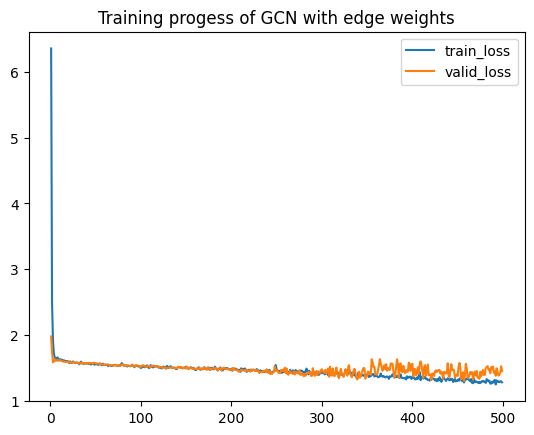

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

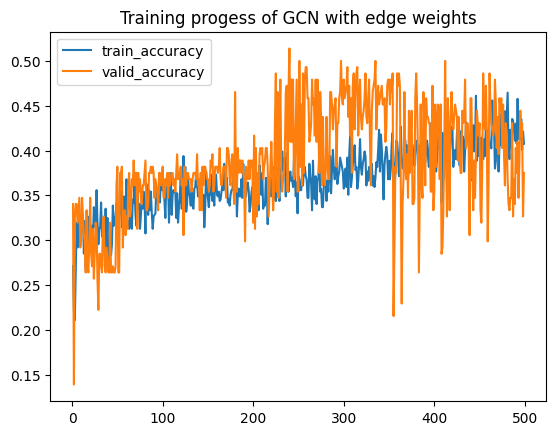

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

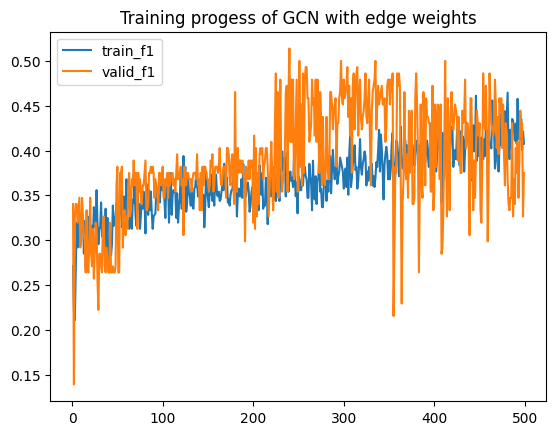

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_f1"],  label = "train_f1")
ax.plot(records_df.index, records_df["valid_f1"], label = "valid_f1")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_weighted.state_dict(), "/content/drive/MyDrive/01 data/data/trained/GCN_weighted.pth")

In [ ]:
# save records
with open("/content/drive/MyDrive/01 data/data/trained/train_records_GCN_weighted.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

#### GCN (MinCut Pooling)

##### I. Model

In [35]:
class GCN_mincut(nn.Module):
  def __init__(self, input_dim, hidden_dim_1, hidden_dim_2, hidden_dim_3, concat_dim, out_dim):
    super(GCN_mincut, self).__init__()
    torch.manual_seed(12345)
    self.conv1 = GCNConv(input_dim, hidden_dim_1)
    self.conv2 = GCNConv(hidden_dim_1, hidden_dim_2)
    self.conv3 = DenseGraphConv(hidden_dim_2, hidden_dim_2)
    self.lin1 = Linear(hidden_dim_2 + concat_dim, hidden_dim_3)
    self.lin2 = Linear(hidden_dim_3, out_dim)
  
  def forward(self, x, edge_index, graph_features, s, batch):
    # 1st graph convolution
    x = self.conv1(x, edge_index)
    x = x.relu()

    # 2nd graph convolution
    x = F.dropout(x, training=self.training)
    x = self.conv2(x, edge_index)
    x = x.relu()

    # mincut pooling
    x, _ = to_dense_batch(x, batch)
    s, _ = to_dense_batch(s, batch)
    adj = to_dense_adj(edge_index, batch)
    x, adj, mc1, o1 = dense_mincut_pool(x, adj, s)

    # 2nd graph convolution
    x = F.dropout(x, training=self.training)
    x = self.conv3(x, adj)
    x = x.relu()

    x = x.view(-1, x.shape[-1])
    
    num_batch = torch.max(batch) + 1
    batch = torch.repeat_interleave(torch.arange(num_batch), s.shape[-1]).to(device)

    # graph pooling
    x = global_mean_pool(x, batch) # [batch_size, hidden_channels]
    x = torch.concat((x, graph_features), dim=1)

    x = F.dropout(x, training=self.training)
    x = self.lin1(x)
    x = x.relu()

    x = self.lin2(x)

    return (x)

In [36]:
gcn_mincut = GCN_mincut(input_dim=16,
                        hidden_dim_1=16,
                        hidden_dim_2=12,
                        hidden_dim_3=10,
                        concat_dim=3,
                        out_dim=6).to(device)
optimizer = optim.Adam(gcn_mincut.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [37]:
gcn_mincut

GCN_mincut(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (conv3): DenseGraphConv(12, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [44]:
# load the pre-trained model
gcn_mincut.load_state_dict(torch.load("/content/drive/MyDrive/01 data/data/trained/GCN_mincut.pth", map_location=device))

<All keys matched successfully>

##### II. Training - Assignment Matrix Spectral Clustering (not KNN, 32 clusters)

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        assignment=True,
                        assignment_knn=False,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut, train_loader, edge_weighted=False, mincut_pool=True, knn_based=False, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut, valid_loader, edge_weighted=False, mincut_pool=True, knn_based=False, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling")
plt.show()

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut.state_dict(), "GCN_mincut.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

##### II. Training - Assignment Matrix KNN (k=5) based, 32 clusters

In [39]:
gcn_mincut = GCN_mincut(input_dim=16,
                        hidden_dim_1=16,
                        hidden_dim_2=12,
                        hidden_dim_3=10,
                        concat_dim=3,
                        out_dim=6).to(device)
optimizer = optim.Adam(gcn_mincut.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [40]:
gcn_mincut

GCN_mincut(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (conv3): DenseGraphConv(12, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [41]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [47]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=5,
                        assignment=True,
                        assignment_knn=True,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

Processing...


  0%|          | 0/723 [00:00<?, ?it/s]

Done!


In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut, train_loader, edge_weighted=False, mincut_pool=True, knn_based=True, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut, valid_loader, edge_weighted=False, mincut_pool=True, knn_based=True, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

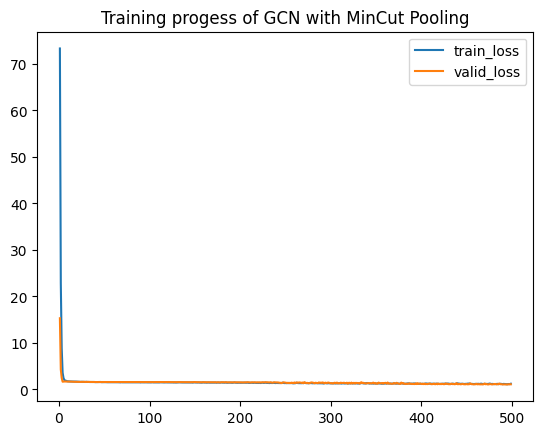

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling")
plt.show()

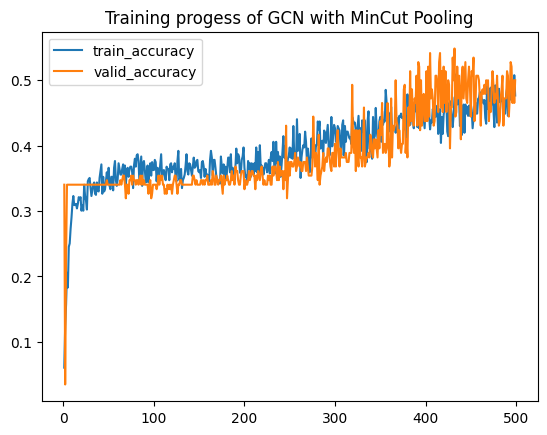

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut.state_dict(), "GCN_mincut_knn_5.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_knn_5.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

##### II. Training - Assignment Matrix KNN (k=50) based, 32 clusters

In [ ]:
gcn_mincut = GCN_mincut(input_dim=16,
                        hidden_dim_1=16,
                        hidden_dim_2=12,
                        hidden_dim_3=10,
                        concat_dim=3,
                        out_dim=6).to(device)
optimizer = optim.Adam(gcn_mincut.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
gcn_mincut

GCN_mincut(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (conv3): DenseGraphConv(12, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=50,
                        assignment=False,
                        assignment_knn=True,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut, train_loader, edge_weighted=False, mincut_pool=True, knn_based=True, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut, valid_loader, edge_weighted=False, mincut_pool=True, knn_based=True, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 72.1397, Valid Loss: 14.4443, Train Acc: 0.0743, Valid Acc: 0.3403
### Epoch: 002 ###
Train Loss: 19.2065, Valid Loss: 5.4004, Train Acc: 0.1364, Valid Acc: 0.2639
### Epoch: 003 ###
Train Loss: 8.2095, Valid Loss: 2.3311, Train Acc: 0.1606, Valid Acc: 0.3403
### Epoch: 004 ###
Train Loss: 3.4806, Valid Loss: 1.6662, Train Acc: 0.1813, Valid Acc: 0.3403
### Epoch: 005 ###
Train Loss: 2.3681, Valid Loss: 1.6748, Train Acc: 0.1710, Valid Acc: 0.3403
### Epoch: 006 ###
Train Loss: 1.9086, Valid Loss: 1.7026, Train Acc: 0.2487, Valid Acc: 0.3403
### Epoch: 007 ###
Train Loss: 1.8467, Valid Loss: 1.7010, Train Acc: 0.2556, Valid Acc: 0.3403
### Epoch: 008 ###
Train Loss: 1.7966, Valid Loss: 1.6970, Train Acc: 0.2642, Valid Acc: 0.3403
### Epoch: 009 ###
Train Loss: 1.7246, Valid Loss: 1.6929, Train Acc: 0.3264, Valid Acc: 0.3403
### Epoch: 010 ###
Train Loss: 1.7307, Valid Loss: 1.6849, Train Acc: 0.3161, Valid Acc: 0.3403
### Epoch: 011 ###
Train Loss: 1.7074

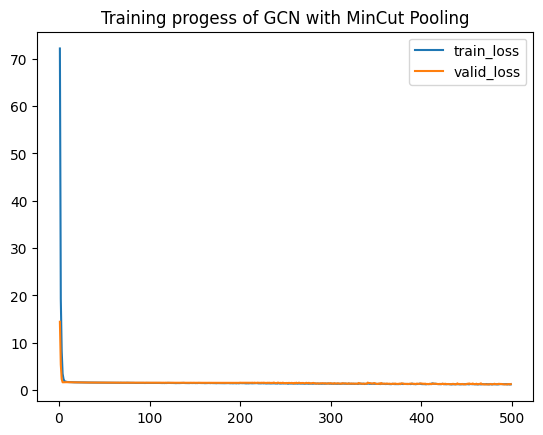

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling")
plt.show()

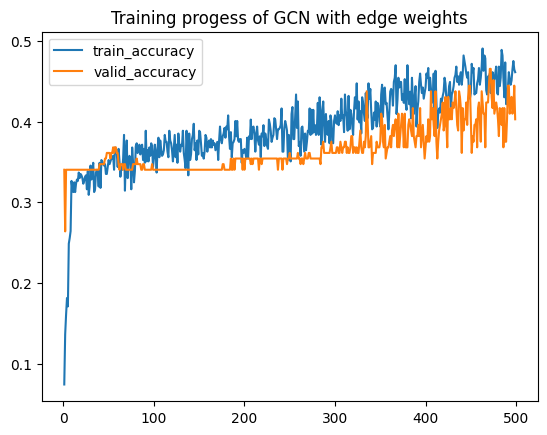

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

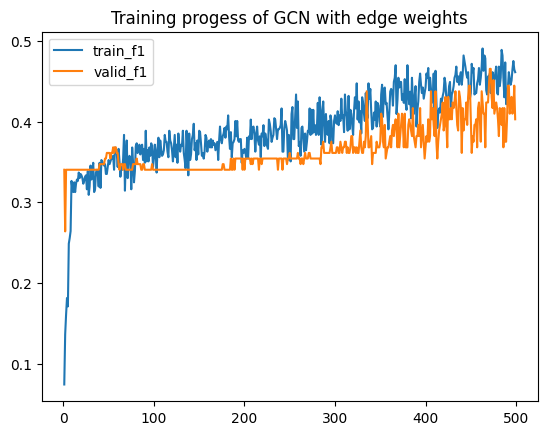

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_f1"],  label = "train_f1")
ax.plot(records_df.index, records_df["valid_f1"], label = "valid_f1")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut.state_dict(), "GCN_mincut_knn_50.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_knn_50.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

##### II. Training - Assignment Matrix KNN (k=150) based, 32 clusters

In [ ]:
gcn_mincut = GCN_mincut(input_dim=16,
                        hidden_dim_1=16,
                        hidden_dim_2=12,
                        hidden_dim_3=10,
                        concat_dim=3,
                        out_dim=6).to(device)
optimizer = optim.Adam(gcn_mincut.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
gcn_mincut

GCN_mincut(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (conv3): DenseGraphConv(12, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=150,
                        assignment=False,
                        assignment_knn=True,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

Processing...


  0%|          | 0/723 [00:00<?, ?it/s]

Done!


In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut, train_loader, edge_weighted=False, mincut_pool=True, knn_based=True, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut, valid_loader, edge_weighted=False, mincut_pool=True, knn_based=True, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 73.3679, Valid Loss: 15.3051, Train Acc: 0.0622, Valid Acc: 0.3403
### Epoch: 002 ###
Train Loss: 22.9674, Valid Loss: 4.3763, Train Acc: 0.1244, Valid Acc: 0.0694
### Epoch: 003 ###
Train Loss: 8.9044, Valid Loss: 2.4401, Train Acc: 0.1572, Valid Acc: 0.2153
### Epoch: 004 ###
Train Loss: 3.5832, Valid Loss: 1.6493, Train Acc: 0.2055, Valid Acc: 0.3403
### Epoch: 005 ###
Train Loss: 2.4208, Valid Loss: 1.6852, Train Acc: 0.1934, Valid Acc: 0.3403
### Epoch: 006 ###
Train Loss: 1.9876, Valid Loss: 1.7016, Train Acc: 0.2470, Valid Acc: 0.3403
### Epoch: 007 ###
Train Loss: 1.8797, Valid Loss: 1.6995, Train Acc: 0.2522, Valid Acc: 0.3403
### Epoch: 008 ###
Train Loss: 1.8398, Valid Loss: 1.6936, Train Acc: 0.2729, Valid Acc: 0.3403
### Epoch: 009 ###
Train Loss: 1.7589, Valid Loss: 1.6914, Train Acc: 0.2919, Valid Acc: 0.3403
### Epoch: 010 ###
Train Loss: 1.7284, Valid Loss: 1.6859, Train Acc: 0.3057, Valid Acc: 0.3403
### Epoch: 011 ###
Train Loss: 1.7200

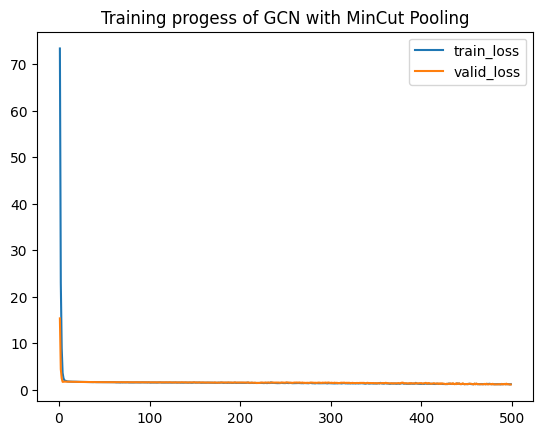

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling")
plt.show()

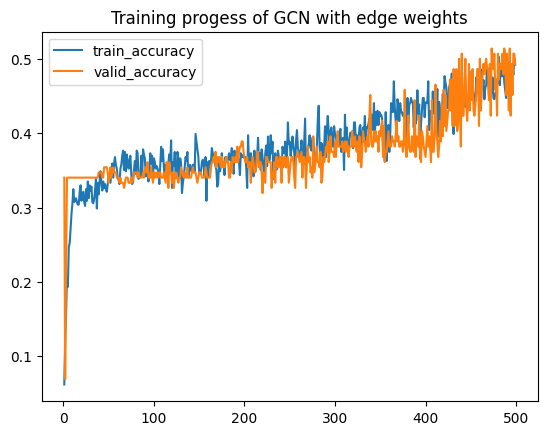

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

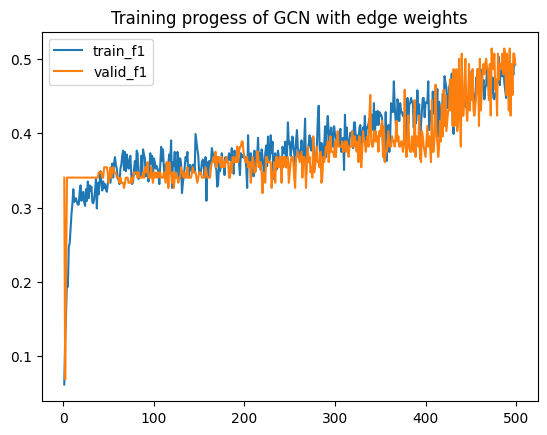

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_f1"],  label = "train_f1")
ax.plot(records_df.index, records_df["valid_f1"], label = "valid_f1")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut.state_dict(), "GCN_mincut_knn_150.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_knn_150.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

#### GCN (MinCut Pooling) + edge weights

##### I. Model

In [ ]:
class GCN_mincut_weighted(nn.Module):
  def __init__(self, input_dim, hidden_dim_1, hidden_dim_2, hidden_dim_3, concat_dim, out_dim):
    super(GCN_mincut_weighted, self).__init__()
    torch.manual_seed(12345)
    self.conv1 = GCNConv(input_dim, hidden_dim_1)
    self.conv2 = GCNConv(hidden_dim_1, hidden_dim_2)
    self.conv3 = DenseGraphConv(hidden_dim_2, hidden_dim_2)
    self.lin1 = Linear(hidden_dim_2 + concat_dim, hidden_dim_3)
    self.lin2 = Linear(hidden_dim_3, out_dim)
  
  def forward(self, x, edge_index, graph_features, edge_attr, s, batch):
    # 1st graph convolution
    x = self.conv1(x, edge_index, edge_weight=edge_attr)
    x = x.relu()

    # 2nd graph convolution
    x = F.dropout(x, training=self.training)
    x = self.conv2(x, edge_index, edge_weight=edge_attr)
    x = x.relu()

    # mincut pooling
    x, _ = to_dense_batch(x, batch)
    s, _ = to_dense_batch(s, batch)
    adj = to_dense_adj(edge_index, batch)
    x, adj, mc1, o1 = dense_mincut_pool(x, adj, s)

    # 3rd graph convolution
    x = F.dropout(x, training=self.training)
    x = self.conv3(x, adj)
    x = x.relu()

    x = x.view(-1, x.shape[-1])

    num_batch = torch.max(batch) + 1
    batch = torch.repeat_interleave(torch.arange(num_batch), s.shape[-1]).to(device)

    # graph pooling
    x = global_mean_pool(x, batch) # [batch_size, hidden_channels]
    x = torch.concat((x, graph_features), dim=1)

    x = F.dropout(x, training=self.training)
    x = self.lin1(x)
    x = x.relu()

    x = self.lin2(x)

    return (x)

In [ ]:
gcn_mincut_weighted = GCN_mincut_weighted(input_dim=16,
                                          hidden_dim_1=16,
                                          hidden_dim_2=12,
                                          hidden_dim_3=10,
                                          concat_dim=3,
                                          out_dim=6).to(device)
optimizer  = optim.Adam(gcn_mincut_weighted.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
gcn_mincut_weighted

GCN_mincut_weighted(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (conv3): DenseGraphConv(12, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [ ]:
# load the pre-trained model
#gcn_mincut_weighted.load_state_dict(torch.load("/content/drive/MyDrive/01 data/04 GCN_Graph Coarsening_weight/01 Original Graph/GCN_mincut_weighted.pth", map_location=device))

##### II. Training - Assignment Matrix Spectral Clustering (not KNN, 32 clusters)

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=10,
                        assignment=True,
                        assignment_knn=False,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

Processing...


  0%|          | 0/723 [00:00<?, ?it/s]

Done!


In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut_weighted, train_loader, edge_weighted=True, mincut_pool=True, knn_based=False, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut_weighted, valid_loader, edge_weighted=True, mincut_pool=True, knn_based=False, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 71.1880, Valid Loss: 12.6981, Train Acc: 0.0570, Valid Acc: 0.3403
### Epoch: 002 ###
Train Loss: 20.7088, Valid Loss: 3.3904, Train Acc: 0.1244, Valid Acc: 0.3333
### Epoch: 003 ###
Train Loss: 7.2353, Valid Loss: 1.9736, Train Acc: 0.1589, Valid Acc: 0.2639
### Epoch: 004 ###
Train Loss: 3.5950, Valid Loss: 1.7223, Train Acc: 0.1623, Valid Acc: 0.3403
### Epoch: 005 ###
Train Loss: 2.2753, Valid Loss: 1.7019, Train Acc: 0.2193, Valid Acc: 0.3403
### Epoch: 006 ###
Train Loss: 2.0614, Valid Loss: 1.6972, Train Acc: 0.2245, Valid Acc: 0.3403
### Epoch: 007 ###
Train Loss: 1.9369, Valid Loss: 1.7024, Train Acc: 0.2332, Valid Acc: 0.3403
### Epoch: 008 ###
Train Loss: 1.8360, Valid Loss: 1.6981, Train Acc: 0.2832, Valid Acc: 0.3403
### Epoch: 009 ###
Train Loss: 1.7656, Valid Loss: 1.6938, Train Acc: 0.2988, Valid Acc: 0.3403
### Epoch: 010 ###
Train Loss: 1.7461, Valid Loss: 1.6890, Train Acc: 0.3212, Valid Acc: 0.3403
### Epoch: 011 ###
Train Loss: 1.7437

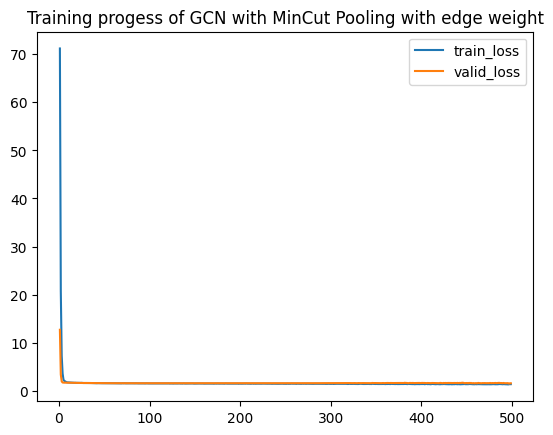

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling with edge weight")
plt.show()

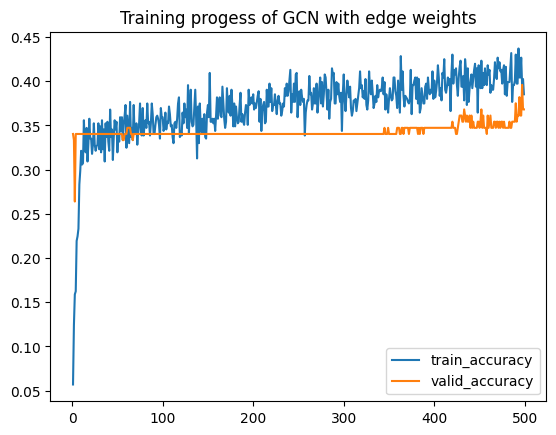

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

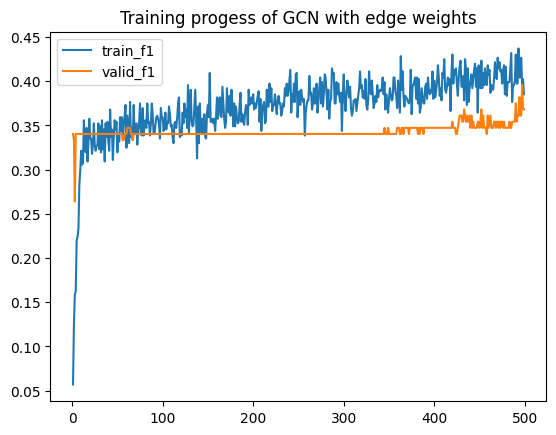

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_f1"],  label = "train_f1")
ax.plot(records_df.index, records_df["valid_f1"], label = "valid_f1")
ax.legend()

plt.title("Training progess of GCN with edge weights")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut_weighted.state_dict(), "GCN_mincut_weighted.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_weighted.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

##### II. Training - Assignment Matrix KNN (k=5) based, 32 clusters

In [ ]:
gcn_mincut_weighted = GCN_mincut_weighted(input_dim=16,
                                          hidden_dim_1=16,
                                          hidden_dim_2=12,
                                          hidden_dim_3=10,
                                          concat_dim=3,
                                          out_dim=6).to(device)
optimizer  = optim.Adam(gcn_mincut_weighted.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()  

gcn_mincut_weighted

GCN_mincut_weighted(
  (conv1): GCNConv(16, 16)
  (conv2): GCNConv(16, 12)
  (conv3): DenseGraphConv(12, 12)
  (lin1): Linear(in_features=15, out_features=10, bias=True)
  (lin2): Linear(in_features=10, out_features=6, bias=True)
)

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=5,
                        assignment=True,
                        assignment_knn=True,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

Processing...


  0%|          | 0/723 [00:00<?, ?it/s]

Done!


In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut_weighted, train_loader, edge_weighted=True, mincut_pool=True, knn_based=True, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut_weighted, valid_loader, edge_weighted=True, mincut_pool=True, knn_based=True, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

### Epoch: 001 ###
Train Loss: 71.1372, Valid Loss: 12.4769, Train Acc: 0.0570, Valid Acc: 0.3403
### Epoch: 002 ###
Train Loss: 20.6944, Valid Loss: 3.3769, Train Acc: 0.1209, Valid Acc: 0.3194
### Epoch: 003 ###
Train Loss: 7.2259, Valid Loss: 1.9885, Train Acc: 0.1572, Valid Acc: 0.2639
### Epoch: 004 ###
Train Loss: 3.5812, Valid Loss: 1.7250, Train Acc: 0.1641, Valid Acc: 0.3403
### Epoch: 005 ###
Train Loss: 2.2731, Valid Loss: 1.7005, Train Acc: 0.2263, Valid Acc: 0.3403
### Epoch: 006 ###
Train Loss: 2.0665, Valid Loss: 1.6982, Train Acc: 0.2228, Valid Acc: 0.3403
### Epoch: 007 ###
Train Loss: 1.9289, Valid Loss: 1.7025, Train Acc: 0.2401, Valid Acc: 0.3403
### Epoch: 008 ###
Train Loss: 1.8365, Valid Loss: 1.6983, Train Acc: 0.2867, Valid Acc: 0.3403
### Epoch: 009 ###
Train Loss: 1.7650, Valid Loss: 1.6938, Train Acc: 0.2902, Valid Acc: 0.3403
### Epoch: 010 ###
Train Loss: 1.7481, Valid Loss: 1.6891, Train Acc: 0.3143, Valid Acc: 0.3403
### Epoch: 011 ###
Train Loss: 1.7460

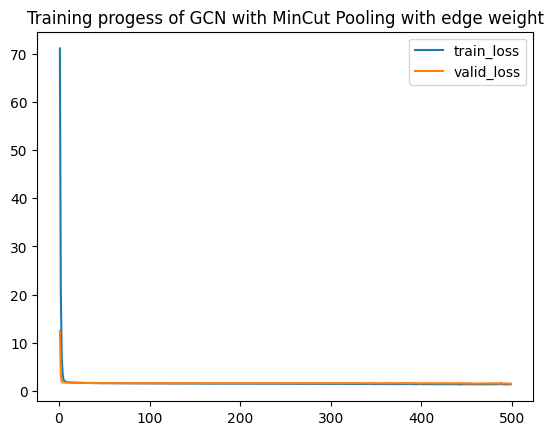

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling with edge weight")
plt.show()

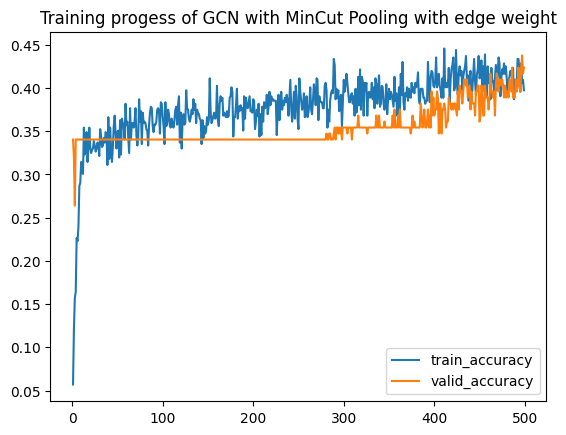

In [ ]:
fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_accuracy"], label = "train_accuracy")
ax.plot(records_df.index, records_df["valid_accuracy"], label = "valid_accuracy")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling with edge weight")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut_weighted.state_dict(), "GCN_mincut_knn_weighted_5.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_knn_weighted_5.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

##### II. Training - Assignment Matrix KNN (k=50) based, 32 clusters

In [ ]:
gcn_mincut_weighted = GCN_mincut_weighted(input_dim=16,
                                          hidden_dim_1=16,
                                          hidden_dim_2=12,
                                          hidden_dim_3=10,
                                          concat_dim=3,
                                          out_dim=6).to(device)
optimizer  = optim.Adam(gcn_mincut_weighted.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()  

gcn_mincut_weighted

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=150,
                        assignment=False,
                        assignment_knn=True,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut_weighted, train_loader, edge_weighted=True, mincut_pool=True, knn_based=False, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut_weighted, valid_loader, edge_weighted=True, mincut_pool=True, knn_based=False, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling with edge weight")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut.state_dict(), "GCN_mincut_knn_weighted_50.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_knn_weighted_50.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

##### II. Training - Assignment Matrix KNN (k=150) based, 32 clusters

In [ ]:
gcn_mincut_weighted = GCN_mincut_weighted(input_dim=16,
                                          hidden_dim_1=16,
                                          hidden_dim_2=12,
                                          hidden_dim_3=10,
                                          concat_dim=3,
                                          out_dim=6).to(device)
optimizer  = optim.Adam(gcn_mincut_weighted.parameters(), lr=0.001, weight_decay=0.0001)
criterion = nn.CrossEntropyLoss()  

gcn_mincut_weighted

In [ ]:
import shutil
shutil.rmtree('/content/drive/MyDrive/01 data/data/processed')

In [ ]:
# initiate a dictionary to store training records
train_records = {"train_loss":{},
                 "valid_loss":{},
                 "train_accuracy":{},
                 "valid_accuracy":{},
                 "train_f1":{},
                 "valid_f1":{}}

In [ ]:
# create CustomDataset object
dataset = CustomDataset(G_dict=G_dict,
                        targets_dict=targets_dict,
                        node_embeddings="all",
                        graph_features=['TG', 'TN', 'TX'],
                        graph_embeddings=['sunny_weekend','cloudy_weekend','rainy_weekend',
                                          'sunny_weekday','cloudy_weekday','rainy_weekday'],     #["sunny","cloudy","rainy","weekend_or_holiday"],
                        n_clusters=32,
                        n_init=10,
                        n_neighbors=50,
                        assignment=False,
                        assignment_knn=True,
                        transform=None,
                        pre_transform=None,
                        device=None
                        )

# create data loaders for training, validatiing, and testing
train_loader, valid_loader = data_loader(dataset, [0.8, 0.2], 32, stratify=False, shuffle=True)

In [ ]:
for epoch in range(1,500):
  print(f"### Epoch: {epoch:03d} ###")
  train_loss, train_acc, train_f1 = train(gcn_mincut_weighted, train_loader, edge_weighted=True, mincut_pool=True, knn_based=False, concat=True)
  valid_loss, valid_acc, valid_f1 =  test(gcn_mincut_weighted, valid_loader, edge_weighted=True, mincut_pool=True, knn_based=False, concat=True)
  
  print(f'Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Train Acc: {train_acc:.4f}, Valid Acc: {valid_acc:.4f}')

  train_records["train_loss"][epoch] = train_loss
  train_records["valid_loss"][epoch] = valid_loss
  train_records["train_accuracy"][epoch] = train_acc
  train_records["valid_accuracy"][epoch] = valid_acc
  train_records["train_f1"][epoch] = train_f1
  train_records["valid_f1"][epoch] = valid_f1

In [ ]:
records_df = pd.DataFrame(train_records)

fig, ax = plt.subplots()
ax.plot(records_df.index, records_df["train_loss"], label = "train_loss")
ax.plot(records_df.index, records_df["valid_loss"], label = "valid_loss")
ax.legend()

plt.title("Training progess of GCN with MinCut Pooling with edge weight")
plt.show()

In [ ]:
# save the trained model
torch.save(gcn_mincut.state_dict(), "GCN_mincut_knn_weighted_150.pth")

In [ ]:
# save records
with open("/content/train_records_GCN_mincut_knn_weighted_150.pickle", 'wb') as pickle_file:
    pickle.dump(train_records, pickle_file)

### 14. Summary

In [ ]:
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
base_dir = "/content/drive/MyDrive/01 data/trained_result"

In [ ]:
# model 0
train_records_gcn_baseline = pd.read_pickle(os.path.join(base_dir, "00 GCN baseline (no concatination)/train_records_GCN_baseline.pickle"))
train_records_gcn_baseline = pd.DataFrame(train_records_gcn_baseline)

train_records_gcn_baseline["model"] = "00 GCN Baseline"
train_records_gcn_baseline["iteration"] = np.arange(len(train_records_gcn_baseline)) + 1

In [ ]:
# model 1
train_records_gcn = pd.read_pickle(os.path.join(base_dir, "01 GCN/train_records_GCN.pickle"))
train_records_gcn = pd.DataFrame(train_records_gcn)

train_records_gcn["model"] = "01 GCN"
train_records_gcn["iteration"] = np.arange(len(train_records_gcn)) + 1

In [ ]:
# model 2
train_records_gcn_weighted = pd.read_pickle(os.path.join(base_dir, "02 GCN_weight/train_records_GCN_weighted.pickle"))
train_records_gcn_weighted = pd.DataFrame(train_records_gcn_weighted)

train_records_gcn_weighted["model"] = "02 GCN with Edge Weights"
train_records_gcn_weighted["iteration"] = np.arange(len(train_records_gcn_weighted)) + 1

In [ ]:
# model 3
train_records_gcn_mincut = pd.read_pickle(os.path.join(base_dir, "03 GCN_Graph Coarsening/01 Original Graph/train_records_GCN_mincut.pickle"))
train_records_gcn_mincut = pd.DataFrame(train_records_gcn_mincut)

train_records_gcn_mincut["model"] = "03 GCN with Graph Coarsening"
train_records_gcn_mincut["iteration"] = np.arange(len(train_records_gcn_mincut)) + 1

In [ ]:
# model 4
train_records_gcn_mincut_knn_5 = pd.read_pickle(os.path.join(base_dir, "03 GCN_Graph Coarsening/02 KNN with k5/train_records_GCN_mincut_knn_5.pickle"))
train_records_gcn_mincut_knn_5 = pd.DataFrame(train_records_gcn_mincut_knn_5)

train_records_gcn_mincut_knn_5["model"] = "04 GCN with Graph Coarsening k5"
train_records_gcn_mincut_knn_5["iteration"] = np.arange(len(train_records_gcn_mincut_knn_5)) + 1

In [ ]:
# model 5
train_records_gcn_mincut_knn_50 = pd.read_pickle(os.path.join(base_dir, "03 GCN_Graph Coarsening/03 KNN with k50/train_records_GCN_mincut_knn_50.pickle"))
train_records_gcn_mincut_knn_50 = pd.DataFrame(train_records_gcn_mincut_knn_50)

train_records_gcn_mincut_knn_50["model"] = "05 GCN with Graph Coarsening k50"
train_records_gcn_mincut_knn_50["iteration"] = np.arange(len(train_records_gcn_mincut_knn_50)) + 1

In [ ]:
# model 6
train_records_gcn_mincut_knn_150 = pd.read_pickle(os.path.join(base_dir, "03 GCN_Graph Coarsening/04 KNN with k150/train_records_GCN_mincut_knn_150.pickle"))
train_records_gcn_mincut_knn_150 = pd.DataFrame(train_records_gcn_mincut_knn_150)

train_records_gcn_mincut_knn_150["model"] = "06 GCN with Graph Coarsening k150"
train_records_gcn_mincut_knn_150["iteration"] = np.arange(len(train_records_gcn_mincut_knn_150)) + 1

In [ ]:
# model 7
train_records_gcn_mincut_weighted = pd.read_pickle(os.path.join(base_dir, "04 GCN_Graph Coarsening_weight/01 Original Graph/train_records_GCN_mincut_weighted.pickle"))
train_records_gcn_mincut_weighted = pd.DataFrame(train_records_gcn_mincut_weighted)

train_records_gcn_mincut_weighted["model"] = "07 GCN with Graph Coarsening"
train_records_gcn_mincut_weighted["iteration"] = np.arange(len(train_records_gcn_mincut_weighted)) + 1

In [ ]:
# model 8
train_records_gcn_mincut_weighted_knn_5 = pd.read_pickle(os.path.join(base_dir, "04 GCN_Graph Coarsening_weight/02 KNN with k5/train_records_GCN_mincut_knn_weighted_5.pickle"))
train_records_gcn_mincut_weighted_knn_5 = pd.DataFrame(train_records_gcn_mincut_weighted_knn_5)

train_records_gcn_mincut_weighted_knn_5["model"] = "08 GCN with Graph Coarsening k5 with Edge Weights"
train_records_gcn_mincut_weighted_knn_5["iteration"] = np.arange(len(train_records_gcn_mincut_weighted_knn_5)) + 1

In [ ]:
# model 9
train_records_gcn_mincut_weighted_knn_50 = pd.read_pickle(os.path.join(base_dir, "04 GCN_Graph Coarsening_weight/03 KNN with k50/train_records_GCN_mincut_knn_weighted_50.pickle"))
train_records_gcn_mincut_weighted_knn_50 = pd.DataFrame(train_records_gcn_mincut_weighted_knn_50)

train_records_gcn_mincut_weighted_knn_50["model"] = "09 GCN with Graph Coarsening k50 with Edge Weights"
train_records_gcn_mincut_weighted_knn_50["iteration"] = np.arange(len(train_records_gcn_mincut_weighted_knn_50)) + 1

In [ ]:
# model 10
train_records_gcn_mincut_weighted_knn_150 = pd.read_pickle(os.path.join(base_dir, "04 GCN_Graph Coarsening_weight/04 KNN with k150/train_records_GCN_mincut_knn_weighted_150.pickle"))
train_records_gcn_mincut_weighted_knn_150 = pd.DataFrame(train_records_gcn_mincut_weighted_knn_150)

train_records_gcn_mincut_weighted_knn_150["model"] = "10 GCN with Graph Coarsening k150 with Edge Weights"
train_records_gcn_mincut_weighted_knn_150["iteration"] = np.arange(len(train_records_gcn_mincut_weighted_knn_150)) + 1

In [ ]:
train_records = pd.concat([train_records_gcn_baseline, 
                           train_records_gcn,
                           train_records_gcn_weighted,
                           train_records_gcn_mincut,
                           train_records_gcn_mincut_knn_5,
                           train_records_gcn_mincut_knn_50,
                           train_records_gcn_mincut_knn_150,
                           train_records_gcn_mincut_weighted,
                           train_records_gcn_mincut_weighted_knn_5,
                           train_records_gcn_mincut_weighted_knn_50,
                           train_records_gcn_mincut_weighted_knn_150], axis=0)

In [ ]:
pd.options.display.float_format = '{:,.3f}'.format

In [ ]:
train_records

,train_loss,valid_loss,train_accuracy,valid_accuracy,train_f1,valid_f1,model,iteration
1,6.659,2.174,0.199,0.264,0.199,0.264,00 GCN Baseline,1
2,3.733,1.859,0.173,0.264,0.173,0.264,00 GCN Baseline,2
3,2.433,1.722,0.166,0.340,0.166,0.340,00 GCN Baseline,3
4,1.963,1.753,0.142,0.340,0.142,0.340,00 GCN Baseline,4
5,1.808,1.757,0.152,0.188,0.152,0.188,00 GCN Baseline,5
...,...,...,...,...,...,...,...,...
495,1.343,1.553,0.408,0.417,0.408,0.417,10 GCN with Graph Coarsening k150 with Edge We...,495
496,1.297,1.532,0.430,0.424,0.430,0.424,10 GCN with Graph Coarsening k150 with Edge We...,496
497,1.352,1.469,0.408,0.438,0.408,0.438,10 GCN with Graph Coarsening k150 with Edge We...,497
498,1.358,1.513,0.401,0.424,0.401,0.424,10 GCN with Graph Coarsening k150 with Edge We...,498


In [ ]:
train_records.query("iteration >= 400").groupby("model").mean().sort_values(by=['model'])

,train_loss,valid_loss,train_accuracy,valid_accuracy,train_f1,valid_f1,iteration
model,,,,,,,
00 GCN Baseline,1.467,1.494,0.371,0.360,0.371,0.360,449.500
01 GCN,1.283,1.401,0.432,0.414,0.432,0.414,449.500
02 GCN with Edge Weights,1.317,1.439,0.409,0.405,0.409,0.405,449.500
03 GCN with Graph Coarsening,1.238,1.242,0.448,0.433,0.448,0.433,449.500
04 GCN with Graph Coarsening k5,1.196,1.144,0.458,0.483,0.458,0.483,449.500
05 GCN with Graph Coarsening k50,1.267,1.298,0.449,0.408,0.449,0.408,449.500
06 GCN with Graph Coarsening k150,1.193,1.217,0.455,0.449,0.455,0.449,449.500
07 GCN with Graph Coarsening,1.385,1.615,0.403,0.353,0.403,0.353,449.500
08 GCN with Graph Coarsening k5 with Edge Weights,1.357,1.542,0.412,0.391,0.412,0.391,449.500


In [ ]:
train_records.query("iteration >= 400").groupby("model").agg(np.std).sort_values(by=['model'])

,train_loss,valid_loss,train_accuracy,valid_accuracy,train_f1,valid_f1,iteration
model,,,,,,,
00 GCN Baseline,0.017,0.036,0.013,0.007,0.013,0.007,29.011
01 GCN,0.029,0.074,0.020,0.055,0.020,0.055,29.011
02 GCN with Edge Weights,0.031,0.066,0.022,0.049,0.022,0.049,29.011
03 GCN with Graph Coarsening,0.056,0.114,0.023,0.038,0.023,0.038,29.011
04 GCN with Graph Coarsening k5,0.039,0.058,0.022,0.032,0.022,0.032,29.011
05 GCN with Graph Coarsening k50,0.038,0.054,0.019,0.024,0.019,0.024,29.011
06 GCN with Graph Coarsening k150,0.043,0.085,0.022,0.043,0.022,0.043,29.011
07 GCN with Graph Coarsening,0.022,0.027,0.015,0.009,0.015,0.009,29.011
08 GCN with Graph Coarsening k5 with Edge Weights,0.025,0.040,0.015,0.017,0.015,0.017,29.011


In [ ]:
colors = {"GCN Baseline":"b",
          "GCN":"r",
          "GCN MinCut k5": "orange",
          "GCN MinCut k50": "purple",
          "GCN MinCut k150": "grey"}

models = train_records['model'].unique()

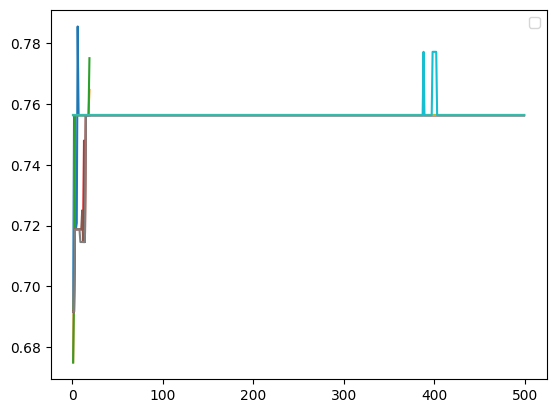

In [ ]:
fig, ax = plt.subplots()

for model in models:
  t_r = train_records[train_records["model"] == model]
  ax.plot(t_r["iteration"], t_r["valid_accuracy"])#, color=colors[model])

ax.legend()
plt.show()

In [ ]:
train_records[(train_records["model"] == model) & (train_records["iteration"] <=200)]

,train_loss,valid_loss,train_accuracy,valid_accuracy,train_f1,valid_f1,model,iteration
1,1.551934,1.584957,0.777230,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,1
2,1.561981,1.585275,0.773940,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,2
3,1.541444,1.585313,0.780519,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,3
4,1.549847,1.585358,0.776133,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,4
5,1.555824,1.585404,0.785819,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,5
...,...,...,...,...,...,...,...,...
196,1.609792,1.582472,0.770833,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,196
197,1.545986,1.582451,0.773575,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,197
198,1.532667,1.582338,0.772844,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,198
199,1.541560,1.582248,0.776499,0.75625,0.0,0.75625,GCN with Graph Coarsening k150 with Edge Weights,199


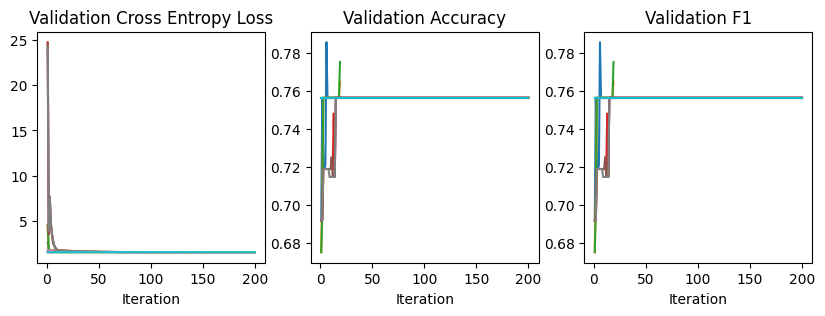

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(10,3))

for model in models:
  t_r = train_records[(train_records["model"] == model) & (train_records["iteration"] <=200)]
  ax[0].plot(t_r["iteration"], t_r["valid_loss"])#, color=colors[model])
  ax[1].plot(t_r["iteration"], t_r["valid_accuracy"])#, color=colors[model])
  ax[2].plot(t_r["iteration"], t_r["valid_f1"])#, color=colors[model])

ax[0].set(xlabel='Iteration')
ax[1].set(xlabel='Iteration')
ax[2].set(xlabel='Iteration')

ax[0].set_title('Validation Cross Entropy Loss')
ax[1].set_title('Validation Accuracy')
ax[2].set_title('Validation F1')

plt.show()